<a href="https://colab.research.google.com/github/fmassini/DataScienceCoderhouse/blob/main/Proyecto_Final_Federico_Massini.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Curso Data Science - Coderhouse

##Comisión: 42365

###Docente: Rubén Darío González

###Tutor: Pedro Miguel Pérez

Autor: Federico Massini

#1 - Abstract

Link presentación ejecutiva:

https://www.canva.com/design/DAFunxBYZVA/T_8mOwGeap-Ib5fWWcb-tQ/edit?utm_content=DAFunxBYZVA&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton

##1.1 - Contexto y problema comercial

La empresa Bosch es conocida por fabricar productos diversos para todo el mundo. Recientemente comenzó a producir un nuevo producto, el cual cuenta con 5 versiones distintas.

Este producto tiene la característica de producirse de una manera diferente a lo que la empresa está acostumbrada, por ello se han desarrollado nuevos procedimientos para llevar adelante la producción.

Estos procedimientos al ser nuevos, lamentablemente distan bastante del ideal; hace falta mucho estudio y trabajo para volverlos más eficientes.

De ahí nace la necesidad de este estudio, con la información que nos proporciona el desarrollador del producto, el sector logístico deberá buscar la manera de optimizar sus procesos, para poder cumplir con los plazos de abastecimiento a planta.

De ninguna manera puede suceder que la línea productiva pare por falta de piezas a la hora de montar, logística debe hacer lo indispensable para evitar este panorama. Y a su vez, hacerlo de la manera más eficiente posible (en cuanto a tiempos y costos).

##1.2 - Contexto analítico y objetivo

El siguiente dataset contiene información sobre las piezas con su respectivo código (referencia) necesarias para construir distintas versiones de un producto en específico. Estas versiones difieren ya que algunas son más completas que otras, o tienen diferentes funciones, y por ende llevan distintas piezas en su ensamblado.

La mercadería viene en cajones llamados "bases" dentro de contenedores. A su vez, cada caja dentro de estas bases tiene dentro un número determinado de piezas (indicado en el dataset). En resumen, las piezas vienen en cajas, las cuales vienen en bases, las cuales a su vez vienen en contenedores. Toda esta información está detallada en el dataset, donde se indica incluso dimensiones, pesos y tipo de packaging de las bases o cajas.

Cada fila además aclara a que versión del producto pertenece la pieza, hay piezas comunes a todos y otras que no lo son. Una vez traidos los contenedores, las piezas deberán separarse en clases. La clase de una pieza determina de qué forma se ensambla, por lo que es necesario clasificar todo antes de comenzar a ensamblar el producto.

Algunos puntos interesantes a ver en este estudio:

1. Como se distribuyen las referencias entre las clases? Hay alguna que contenga más variedad?
2. Para contar con el total de piezas de una referencia, cuantas cajas se deben abrir aproximadamente?
3. Las bases, cuantas cajas traen? Y referencias? Cómo viene la mercadería distribuída?
4. Cada referencia, en cuantas versiones se usa? Hay muchas comunes a todas?
5. Qué clase conlleva más volumen?
6. Cuáles versiones son más parecidas/diferentes entre si?
7. Existe algún patrón entre las bases? Se pueden clasificar?
8. Se puede preever cual será el tipo de pallet en el cual irá una referencia, solo conociendo información de ella misma?

Por otro lado, en determinadas ocasiones sucede que logística tiene rotura de piezas, las cuales es necesario reponer. Para esto, se hacen solicitudes al proveedor de envíos puntuales, con la mercadería específica que se necesita.

Esta mercadería puede venir en diferentes tipos de packaging, el cual determina las condiciones de almacenamiento a posteriori. De ahí, se abren otros puntos interesantes a analizar:

7. En el caso de que logística necesite pedir un envío especial de piezas a reponer, es posible predecir en qué tipo de packaging lo enviará el proveedor?
8. Qué variables son importantes a la hora de predecir dicho packaging?
9. Es posible deducir qué lógica usa el proveedor para seleccionarlo?
10. Cuántos días demora un envío? Qué tanto varía según cuál sea el país de destino?
11. Qué variable es más importante a la hora de calcular el costo del envío? El peso? El volumen? Otra?
12. Cual sea la variable de la respuesta anterior, también afecta los días que demora un envío en llegar?

Todos estos puntos indudablemente ayudan a optimizar el proceso de ingreso de la mercadería, tanto para lo que es inspección como para almacenamiento y traslado. Es crítico que todas las piezas se encuentren en el lugar correcto a la hora de producir, y lo que buscamos es volver más eficiente el camino a dicho objetivo.

Fuente: https://docs.google.com/spreadsheets/d/1PeO17z4eE4ftrbbM4lVSYoR5cN5qbC2c/edit?usp=sharing&ouid=111044325679429769254&rtpof=true&sd=true

#2 - Data acquisition

##2.1 - Importando librerías y realizando conexiones

In [ ]:
!git clone https://github.com/tctianchi/pyvenn.git
%cd pyvenn
!pip install venn
import venn #Importo librería especializada para generar diagramas de Venn de más de 3 sets (límite de Matplotlib)

In [ ]:
!pip install scikit-optimize
from skopt import BayesSearchCV #Importando librería específica de grillas para tuneo de hiperparámetros

In [ ]:
from google.colab import drive #Conectando a Drive
drive.mount('/content/gdrive')
%cd /content/gdrive/MyDrive/Files

In [ ]:
import pandas as pd #Aquí se listan todas las librerías importadas
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.patches import Circle
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import missingno as msno
from PIL import Image
from IPython.display import display, HTML
import statsmodels.api as sm
from scipy import stats
from itertools import cycle
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score, silhouette_score, RocCurveDisplay
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelBinarizer
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import requests
import warnings
warnings.filterwarnings('ignore') #Omito alertas

##2.2 - Conociendo las variables del DS

###2.2.1 - Diccionario de columnas del DS

In [ ]:
DSNX_IND=pd.read_excel('DSNX.xlsx',sheet_name='Hoja2')
DSNX_IND.head(17)

,COLUMNA,DESCRIPCIÓN,EJEMPLO 1,EJEMPLO 2
0,CLASE,Sector en el cual se ensambla esta pieza,F1,A
1,VERSION,Versión del producto al cual pertenece esta pieza,M42,A42
2,CONTENEDOR,Contenedor en el cual viene esta pieza,CMAU4908460,MRSU3285393
3,BASE,Base en la cual viene esta pieza,AF0001,MP001
4,TIPO BASE,Tipo de base,IRON FRAME,IRON FRAME
5,LARGO BASE,Largo de la base en mm,2110,2250
6,ANCHO BASE,Ancho de la base en mm,600,1700
7,ALTURA BASE,Altura de la base en mm,1200,1050
8,PESO BASE,Peso de la base en kg,205,861.0
9,CAJA,Caja en la cual viene esta pieza,AF0001,MC0072


###2.2.2 - Diagrama final resumiendo toda la operativa

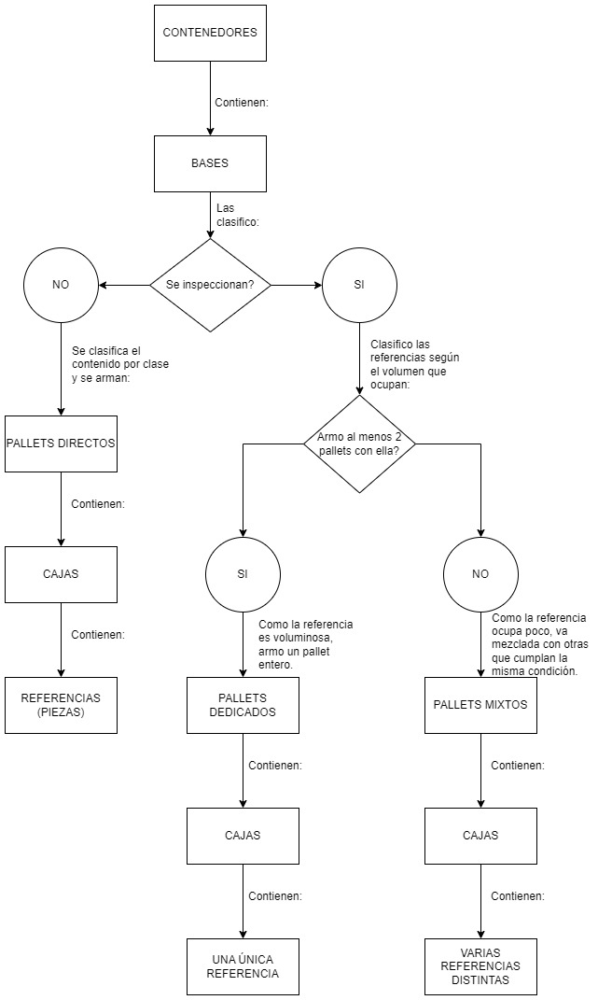

In [ ]:
imagen = Image.open('Flujo.jpg')
display(imagen)

#3 - Data wrangling

##3.1 - Generación de columnas nuevas para estudiar las bases

In [ ]:
DSNX=pd.read_excel('DSNX.xlsx',sheet_name='Hoja1') #Cargo DS

In [ ]:
DSNX['CAJAS/BASE'] = DSNX.groupby(['BASE', 'VERSION'])['BASE'].transform('count') #Genero la columna CAJAS/BASE

In [ ]:
DSNX['REFS/BASE'] = DSNX.groupby(['BASE', 'VERSION'])['REFERENCIA'].transform('nunique') #Genero la columna REFS(distintas)/BASE

In [ ]:
DSNX['CLASES/BASE'] = DSNX.groupby(['BASE', 'VERSION'])['CLASE'].transform('nunique') #Genero la columna CLASES/BASE

Como se explicaba en la introducción, para comenzar a producir es necesario clasificar las piezas en clases. Para esto se debe inspeccionar la mercadería que ingresa, aunque no es necesario hacerlo para todas las bases.

Si las referencias que vienen en la base, pertenecen a distintas clases, se deberá inspeccionar y clasificar, de lo contrario no hará falta, y la base se abatecerá directamente a la clase correspondiente.

In [ ]:
DSNX['INSPECCIÓN'] = np.where(DSNX['CLASES/BASE']>1, 1, 0) #Si la base tiene referencias pertenecientes a más de una clase, la inspecciono

##3.2 - Generación de columnas nuevas para estudiar las cajas

In [ ]:
DSNX['REFS/CAJA'] = DSNX.groupby(['CAJA', 'VERSION'])['REFERENCIA'].transform('nunique') #Genero la columna REFS(distintas)/CAJA

In [ ]:
DSNX['VOLUMEN CAJA'] = (DSNX['LARGO CAJA']/1000) * (DSNX['ANCHO CAJA']/1000) * (DSNX['ALTURA CAJA']/1000) #Volumen de la caja en m3

In [ ]:
DSNX['VOLUMEN CAJA/REF'] = DSNX['VOLUMEN CAJA']/DSNX['REFS/CAJA'] #Genero la columna que indique cuanto volumen ocupa la referencia de la fila en cuestión. Si la caja trae múltiples referencias, divido entre esa cantidad

In [ ]:
DSNX['VOL TOTAL'] = DSNX.groupby(['VERSION','INSPECCIÓN','REFERENCIA'])['VOLUMEN CAJA/REF'].transform('sum') #La idea aquí es calcular cuanto volumen en total ocuparía cada referencia, por versión. Separamos según si la base es inspeccionable o no, ya que la pieza recorre un camino distinto en cada caso

Ahora que conocemos el volumen que ocupa cada referencia, podemos calcular a cuantos pallets equivaldría dentro de una clase.

Recordemos que tenemos 2 tipos de bases, las inspeccionables y las que no.
Las inspeccionables se deberán revisar y armar pallets con la mercadería que contienen.

Lo más fácil para abastecer, es llevar pallets que contengan una sola referencia, ya que los que poseen muchas tienen el problema de que el operario debe "revolver" el pallet para encontrar una referencia en específico.
Por ello, lo ideal sería que cada pallet contenga cajas de una única referencia. El problema está en que no siempre el volumen justifica hacer esto, por ello algunas referencias podrán ir en pallets monoproducto (dedicados) y otras deberán ir en multiproducto (mixtos).

Tomaremos como criterio que armaremos pallets dedicados (una sola ref.) solamente de aquellas referencias que junten en volumen más de 2 pallets completos. El resto irá en pallets mixtos.

En cuanto a las bases no inspeccionables, se abastecen directamente, por ello les llamaremos "DIRECTOS".

A continuación, realizamos estos cálculos y obtenemos el DS final para trabajar.

In [ ]:
VOL_PALLET = 1.2*1.0*1.4 #Volumen que ocupa un pallet completo
DSNX['TIPO PALLET'] = np.where(DSNX['VOL TOTAL']>(2*VOL_PALLET), 'DEDICADO', 'MIXTO') #Si, por versión, una referencia junta más de 2 pallets en una clase, voy a armar pallets monoproducto (dedicados) de esa referencia, de lo contrario irá en pallets mezclados (mixtos)
DSNX['TIPO PALLET'] = np.where(DSNX['INSPECCIÓN']==0, 'DIRECTO', DSNX['TIPO PALLET']) #Esto anterior aplica solo a lo inspeccionable, lo otro se considera "directo"
#DSNX.to_excel('EXTRAIDO.xlsx', index=False)
DSNX

,CLASE,VERSION,CONTENEDOR,BASE,TIPO BASE,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJA,...,UNID/CAJA,CAJAS/BASE,REFS/BASE,CLASES/BASE,INSPECCIÓN,REFS/CAJA,VOLUMEN CAJA,VOLUMEN CAJA/REF,VOL TOTAL,TIPO PALLET
0,F1,M42,CMAU4908460,AF0001,IRON FRAME,2110,600,1200,205.0,AF0001,...,16,1,1,1,0,1,0.022100,0.022100,0.132600,DIRECTO
1,F1,M42,CMAU4908460,AF0002,IRON FRAME,2110,600,1200,205.0,AF0002,...,16,1,1,1,0,1,0.022100,0.022100,0.132600,DIRECTO
2,F1,M42,CMAU4908460,AF0003,IRON FRAME,2110,600,1200,205.0,AF0003,...,16,1,1,1,0,1,0.022100,0.022100,0.132600,DIRECTO
3,F1,M42,CMAU4908460,AF0004,IRON FRAME,2110,600,1200,205.0,AF0004,...,16,1,1,1,0,1,0.022100,0.022100,0.132600,DIRECTO
4,F1,M42,CMAU4908460,AF0005,IRON FRAME,2110,600,1200,205.0,AF0005,...,16,1,1,1,0,1,0.022100,0.022100,0.132600,DIRECTO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23599,A,A42,MRSU3285393,MP001,IRON FRAME,2250,1700,1050,861.0,MC0074,...,96,94,54,1,0,4,0.091080,0.022770,0.022770,DIRECTO
23600,A,A42,MRSU3285393,MP001,IRON FRAME,2250,1700,1050,861.0,MC0074,...,96,94,54,1,0,4,0.091080,0.022770,0.022770,DIRECTO
23601,A,A42,MRSU3285393,MP001,IRON FRAME,2250,1700,1050,861.0,MC0074,...,96,94,54,1,0,4,0.091080,0.022770,0.022770,DIRECTO
23602,A,A42,MRSU3285393,MP001,IRON FRAME,2250,1700,1050,861.0,MC0074,...,96,94,54,1,0,4,0.091080,0.022770,0.022770,DIRECTO


In [ ]:
DSNX.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23604 entries, 0 to 23603
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   CLASE             23604 non-null  object 
 1   VERSION           23604 non-null  object 
 2   CONTENEDOR        23604 non-null  object 
 3   BASE              23604 non-null  object 
 4   TIPO BASE         23604 non-null  object 
 5   LARGO BASE        23604 non-null  int64  
 6   ANCHO BASE        23604 non-null  int64  
 7   ALTURA BASE       23604 non-null  int64  
 8   PESO BASE         23604 non-null  float64
 9   CAJA              23604 non-null  object 
 10  TIPO CAJA         23604 non-null  object 
 11  LARGO CAJA        23604 non-null  int64  
 12  ANCHO CAJA        23604 non-null  int64  
 13  ALTURA CAJA       23604 non-null  int64  
 14  PESO CAJA         23604 non-null  float64
 15  REFERENCIA        23604 non-null  object 
 16  UNID/CAJA         23604 non-null  int64 

No tenemos NaNs, y lo podemos ver gráficamente a continuación

<Axes: >

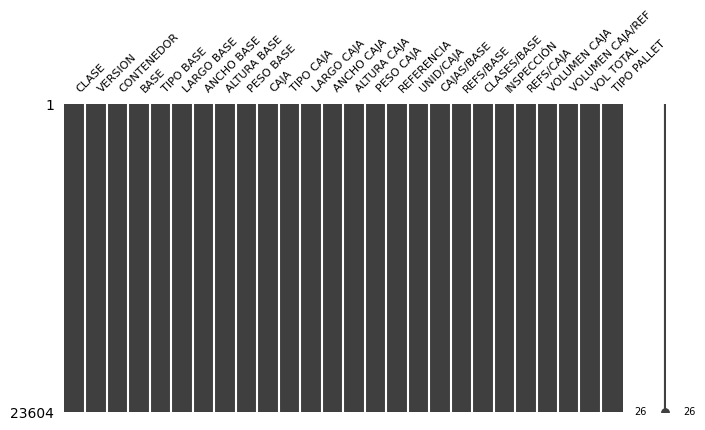

In [ ]:
msno.matrix(DSNX, figsize=(8,4), fontsize=8)

#4 - Exploratory data analysis

###4.1 - Graficamos cuantas referencias distintas pertenecen a cada clase, promediando por versión

A continuación el análisis, un pequeño glosario y el gráfico.

In [ ]:
DSNX_1 = DSNX.groupby(['CLASE', 'VERSION'])['REFERENCIA'].nunique().unstack() #Quiero saber cuantas referencias distintas hay en cada clase, por versión
DSNX_1['PROMEDIO'] =  DSNX_1.mean(axis=1, skipna=True) #Calculo el promedio por versión
DSNX_1

VERSION,A41,A42,M21,M41,M42,PROMEDIO
CLASE,,,,,,
A,66,73,66,66,73,68.8
CA1,25,33,25,25,33,28.2
CA2,33,33,37,39,39,36.2
CA3,39,37,39,39,37,38.2
CA4,44,45,44,44,45,44.4
CA5,16,16,16,16,16,16.0
CA6,29,31,29,29,31,29.8
CA7,20,22,20,20,22,20.8
CH1,15,15,14,15,15,14.8


In [ ]:
DSNX_IND[(DSNX_IND['COLUMNA']=='REFERENCIA') | (DSNX_IND['COLUMNA']=='CLASE') | (DSNX_IND['COLUMNA']=='VERSION')]

,COLUMNA,DESCRIPCIÓN,EJEMPLO 1,EJEMPLO 2
0,CLASE,Sector en el cual se ensambla esta pieza,F1,A
1,VERSION,Versión del producto al cual pertenece esta pieza,M42,A42
15,REFERENCIA,Código de esta pieza,2804110-BU01,6900006P201D


Text(0.5, 1.0, 'REFERENCIAS DISTINTAS INVOLUCRADAS POR CLASE (PROMEDIO POR VERSIÓN)')

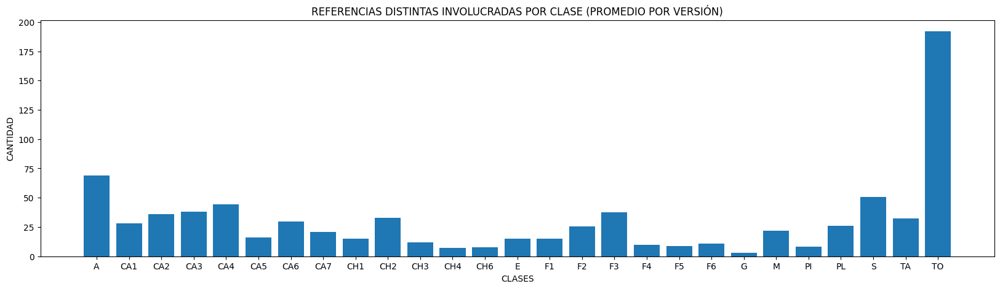

In [ ]:
fig, ax = plt.subplots(figsize=(20,5))
ax.bar(DSNX_1.index,DSNX_1['PROMEDIO'])
ax.set_xlabel('CLASES')
ax.set_ylabel('CANTIDAD')
ax.set_title('REFERENCIAS DISTINTAS INVOLUCRADAS POR CLASE (PROMEDIO POR VERSIÓN)')

Podemos concluir dos cosas:

La primera, es que en general todas las clases contienen más o menos la misma cantidad de referencias distintas. Solo la clase "TO" sobresale.

Esto tiene sentido, ya que las referencias pertenecientes a dicha clase son tornillería, de las cuales hay mucha variedad.

###4.2 - Graficamos cuantas cajas vienen de cada referencia, diferenciando por versión

A continuación el análisis, un pequeño glosario y un par de gráficos (con y sin outliers).

In [ ]:
DSNX_2 = DSNX.groupby(['REFERENCIA', 'VERSION'])['CAJA'].nunique().unstack() #Quiero saber cuantas cajas vienen por referencia, por versión. Para ello necesito los códigos únicos de cada referencia, y contar cuantas cajas hay involucradas de cada una
DSNX_2 = DSNX_2.fillna(0)
DSNX_2

VERSION,A41,A42,M21,M41,M42
REFERENCIA,,,,,
09103-06002,1.0,1.0,1.0,1.0,1.0
09103-06005,1.0,1.0,1.0,1.0,1.0
09103-06006,1.0,1.0,1.0,1.0,1.0
09103-06006-S111,1.0,1.0,1.0,1.0,1.0
09103-06007,2.0,2.0,1.0,2.0,2.0
...,...,...,...,...,...
N807154,1.0,1.0,1.0,1.0,1.0
Q2734816F31,1.0,1.0,1.0,1.0,1.0
Q4400412,1.0,1.0,1.0,1.0,1.0


In [ ]:
DSNX_IND[(DSNX_IND['COLUMNA']=='REFERENCIA') | (DSNX_IND['COLUMNA']=='CAJA') | (DSNX_IND['COLUMNA']=='VERSION')]

,COLUMNA,DESCRIPCIÓN,EJEMPLO 1,EJEMPLO 2
1,VERSION,Versión del producto al cual pertenece esta pieza,M42,A42
9,CAJA,Caja en la cual viene esta pieza,AF0001,MC0072
15,REFERENCIA,Código de esta pieza,2804110-BU01,6900006P201D


Text(0.5, 1.0, 'CANTIDAD DE CAJAS POR REFERENCIA (SEPARADO POR VERSIÓN)')

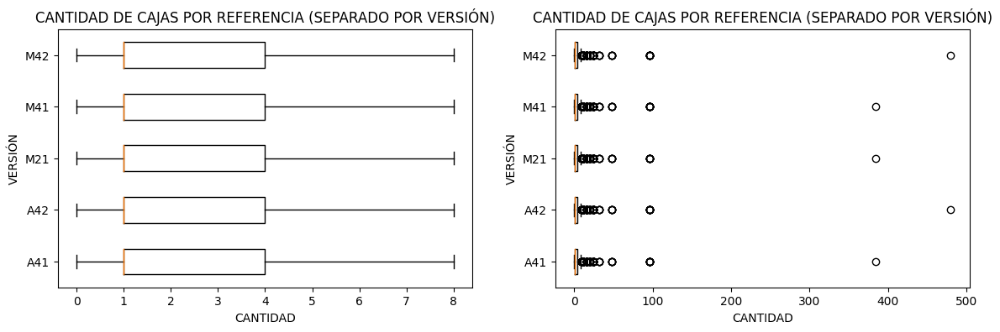

In [ ]:
fig, ax = plt.subplots(figsize=(14,4),nrows=1,ncols=2)
ax[0].boxplot(DSNX_2,vert=False,labels=DSNX_2.columns,showfliers=False) #Asi puedo sacar outliers
ax[0].set_xlabel('CANTIDAD')
ax[0].set_ylabel('VERSIÓN')
ax[0].set_title('CANTIDAD DE CAJAS POR REFERENCIA (SEPARADO POR VERSIÓN)')
ax[1].boxplot(DSNX_2,vert=False,labels=DSNX_2.columns,showfliers=True)
ax[1].set_xlabel('CANTIDAD')
ax[1].set_ylabel('VERSIÓN')
ax[1].set_title('CANTIDAD DE CAJAS POR REFERENCIA (SEPARADO POR VERSIÓN)')

Sabemos que las referencias vienen en cajas. Ahora, supongamos que hay en total 100 piezas de la referencia X. La pregunta es, en cuantas cajas vienen distribuídas esas 100 piezas? Abriendo 2 cajas ya cuento con las 100?

Efectivamente vemos que, para la mayoría de las referencias, abriendo entre 1 y 4 cajas ya contamos con el total de piezas de esa referencia. Solo en casos muy puntuales tenemos referencias cuyo total viene en muchas cajas.

Llama la atención que las distribuciones sean tan parecidas versión a versión, calculemos los valores para confirmarlo.

In [ ]:
q1= {clave: None for clave in DSNX_2.columns}
q2= {clave: None for clave in DSNX_2.columns}
q3= {clave: None for clave in DSNX_2.columns}
lim_min = {clave: None for clave in DSNX_2.columns}
lim_max = {clave: None for clave in DSNX_2.columns}

for i in DSNX_2.columns:
  q1[i] = DSNX_2[i].quantile(0.25) #1er cuartil
  q2[i] = DSNX_2[i].quantile(0.50) #Mediana
  q3[i] = DSNX_2[i].quantile(0.75) #3er cuartil
  lim_min[i] = q1[i] - (1.5 * (q3[i] - q1[i])) #Bigote inferior
  lim_max[i] = q3[i] + (1.5 * (q3[i] - q1[i])) #Bigote superior, cualquier punto más allá de los bigotes son outliers

print('q1:',q1)
print('q2:',q2)
print('q3:',q3)
print('lim_min:',lim_min)
print('lim_max:',lim_max)

q1: {'A41': 1.0, 'A42': 1.0, 'M21': 1.0, 'M41': 1.0, 'M42': 1.0}
q2: {'A41': 1.0, 'A42': 1.0, 'M21': 1.0, 'M41': 1.0, 'M42': 1.0}
q3: {'A41': 4.0, 'A42': 4.0, 'M21': 4.0, 'M41': 4.0, 'M42': 4.0}
lim_min: {'A41': -3.5, 'A42': -3.5, 'M21': -3.5, 'M41': -3.5, 'M42': -3.5}
lim_max: {'A41': 8.5, 'A42': 8.5, 'M21': 8.5, 'M41': 8.5, 'M42': 8.5}


Efectivamente las distribuciones son iguales. Procedamos a realizar un gráfico distinto para intentar explicarlo.

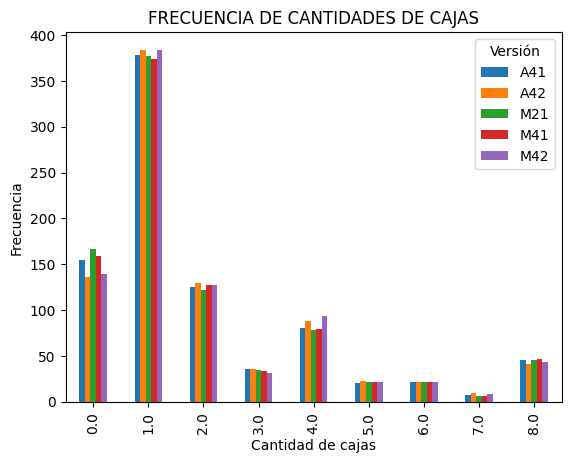

In [ ]:
value_counts = DSNX_2.apply(pd.value_counts)
value_counts = value_counts.loc[0:8]
value_counts.plot(kind='bar')
plt.xlabel('Cantidad de cajas')
plt.ylabel('Frecuencia')
plt.title('FRECUENCIA DE CANTIDADES DE CAJAS')
plt.legend(title='Versión')
plt.show()

Observamos que hay pequeñas diferencias entre las versiones, pero son tan mínimas que, a la hora de calcular las distribuciones, los cuartiles terminan siendo los mismos.

Esto significa que, cuando cambio de una versión a otra, las referencias que dejo de usar terminan siendo compensadas con las nuevas que comienzo a usar.

Supongamos que la versión A41 usa las referencias A, B y C. Al cambiar a la versión A42, dejo de usar la referencia B y comienzo a usar la D. La distribución no cambiará mucho, ya que D termina "compensando" a B.



###4.3 - Graficamos cuantas cajas vienen por base, diferenciando por versión y si la base es inspeccionable o no

A continuación el análisis, un pequeño glosario y el gráfico.

In [ ]:
DSNX_3 = DSNX.drop_duplicates(subset=['VERSION', 'BASE']) #Quiero saber cuantas bases de cada tipo tengo por versión
DSNX_3 = DSNX_3.reset_index(drop=True)
DSNX_3

,CLASE,VERSION,CONTENEDOR,BASE,TIPO BASE,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJA,...,UNID/CAJA,CAJAS/BASE,REFS/BASE,CLASES/BASE,INSPECCIÓN,REFS/CAJA,VOLUMEN CAJA,VOLUMEN CAJA/REF,VOL TOTAL,TIPO PALLET
0,F1,M42,CMAU4908460,AF0001,IRON FRAME,2110,600,1200,205.00,AF0001,...,16,1,1,1,0,1,0.02210,0.02210,0.1326,DIRECTO
1,F1,M42,CMAU4908460,AF0002,IRON FRAME,2110,600,1200,205.00,AF0002,...,16,1,1,1,0,1,0.02210,0.02210,0.1326,DIRECTO
2,F1,M42,CMAU4908460,AF0003,IRON FRAME,2110,600,1200,205.00,AF0003,...,16,1,1,1,0,1,0.02210,0.02210,0.1326,DIRECTO
3,F1,M42,CMAU4908460,AF0004,IRON FRAME,2110,600,1200,205.00,AF0004,...,16,1,1,1,0,1,0.02210,0.02210,0.1326,DIRECTO
4,F1,M42,CMAU4908460,AF0005,IRON FRAME,2110,600,1200,205.00,AF0005,...,16,1,1,1,0,1,0.02210,0.02210,0.1326,DIRECTO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,A,A42,MRSU3285393,MF004,IRON FRAME,2250,1800,1000,406.57,MF004,...,61,1,1,1,0,1,4.05000,4.05000,7.4250,DIRECTO
2361,A,A42,MRSU3285393,MF005,IRON FRAME,2250,1800,1000,740.00,MF005,...,96,3,3,1,0,3,4.05000,1.35000,1.3500,DIRECTO
2362,A,A42,MRSU3285393,MF006,IRON FRAME,2250,1800,1000,664.00,MF006,...,61,1,1,1,0,1,4.05000,4.05000,6.0750,DIRECTO
2363,A,A42,MRSU3285393,MF007,IRON FRAME,2250,1800,1000,616.44,MF007,...,48,2,2,1,0,2,4.05000,2.02500,3.0375,DIRECTO


In [ ]:
DSNX_IND[(DSNX_IND['COLUMNA']=='CAJA') | (DSNX_IND['COLUMNA']=='BASE') | (DSNX_IND['COLUMNA']=='VERSION') | (DSNX_IND['COLUMNA']=='INSPECCIÓN')]

,COLUMNA,DESCRIPCIÓN,EJEMPLO 1,EJEMPLO 2
1,VERSION,Versión del producto al cual pertenece esta pieza,M42,A42
3,BASE,Base en la cual viene esta pieza,AF0001,MP001
9,CAJA,Caja en la cual viene esta pieza,AF0001,MC0072
19,INSPECCIÓN,Indica si el pallet se deberá inspeccionar o no,0,1


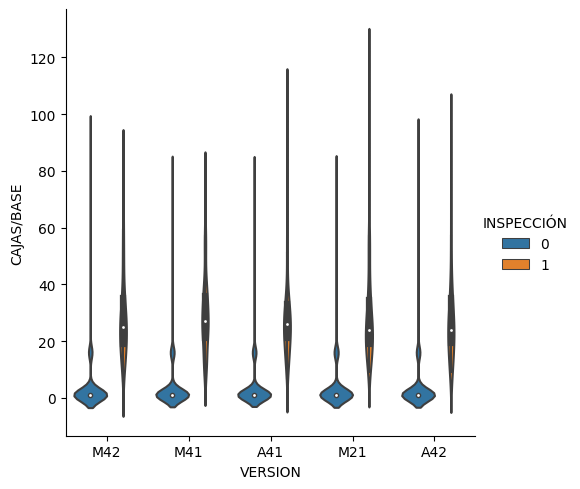

In [ ]:
sns.catplot(data=DSNX_3,kind='violin',y='CAJAS/BASE',x='VERSION',hue='INSPECCIÓN',split=False)

Aquí se pueden sacar varias conclusiones importantes:

1) Sabemos que entre más cajas tenga una base, más referencias distintas va a tener, ya que vimos que las referencias vienen generalmente en 1-4 cajas.

2) Si tiene más referencias, es más probable que haya más de una clase involucrada, y las bases inspeccionables son justamente aquellas que cumplen dicha condición.

3) Por ende, es natural pensar que las bases no inspeccionables generalmente tendrán pocas cajas, y las inspeccionables al contrario.

4) A pesar de esto, tenemos excepciones de bases no inspeccionables con muchas cajas, esto también coincide con el análisis de los gráficos anteriores, ya que habían referencias que excepcionalmente venían en muchas cajas.

5) Vemos que en este caso, las distribuciones versión a versión son parecidas, aunque no iguales.

Analicemos mejor este punto.

In [ ]:
DSNX.groupby('VERSION')['CONTENEDOR'].nunique() #Cuantos contenedores tengo por versión?

VERSION
A41    36
A42    36
M21    36
M41    36
M42    36
Name: CONTENEDOR, dtype: int64

Hemos visto que la distribución de cantidad de cajas por referencia apenas varía versión a versión. A su vez, vemos que la cantidad de contenedores tampoco varía.

Por ende, si los contenedores no varían en cantidad, y las cajas por referencia tampoco, es lógico que las cajas por base tengan distribuciones muy similares. En otras palabras, si la cantidad de contenedores y cajas no varían, las cajas por base tampoco.

###4.4 - Graficamos cuantas referencias coinciden por versión

A continuación el análisis, un pequeño glosario y el gráfico.

In [ ]:
DSNX_4 = DSNX.groupby(['REFERENCIA', 'VERSION'])['REFERENCIA'].nunique().unstack() #Con esto veo en que versión se usa cada referencia
DSNX_4 = DSNX_4.fillna(0)
DSNX_4['INDEX'] = DSNX_4.index
A41 = DSNX_4[DSNX_4.iloc[:, 0] == 1].iloc[:, 5]
A42 = DSNX_4[DSNX_4.iloc[:, 1] == 1].iloc[:, 5]
M21 = DSNX_4[DSNX_4.iloc[:, 2] == 1].iloc[:, 5]
M41 = DSNX_4[DSNX_4.iloc[:, 3] == 1].iloc[:, 5]
M42 = DSNX_4[DSNX_4.iloc[:, 4] == 1].iloc[:, 5]
DSNX_4

VERSION,A41,A42,M21,M41,M42,INDEX
REFERENCIA,,,,,,
09103-06002,1.0,1.0,1.0,1.0,1.0,09103-06002
09103-06005,1.0,1.0,1.0,1.0,1.0,09103-06005
09103-06006,1.0,1.0,1.0,1.0,1.0,09103-06006
09103-06006-S111,1.0,1.0,1.0,1.0,1.0,09103-06006-S111
09103-06007,1.0,1.0,1.0,1.0,1.0,09103-06007
...,...,...,...,...,...,...
N807154,1.0,1.0,1.0,1.0,1.0,N807154
Q2734816F31,1.0,1.0,1.0,1.0,1.0,Q2734816F31
Q4400412,1.0,1.0,1.0,1.0,1.0,Q4400412


In [ ]:
DSNX_IND[(DSNX_IND['COLUMNA']=='REFERENCIA') | (DSNX_IND['COLUMNA']=='VERSION')]

,COLUMNA,DESCRIPCIÓN,EJEMPLO 1,EJEMPLO 2
1,VERSION,Versión del producto al cual pertenece esta pieza,M42,A42
15,REFERENCIA,Código de esta pieza,2804110-BU01,6900006P201D


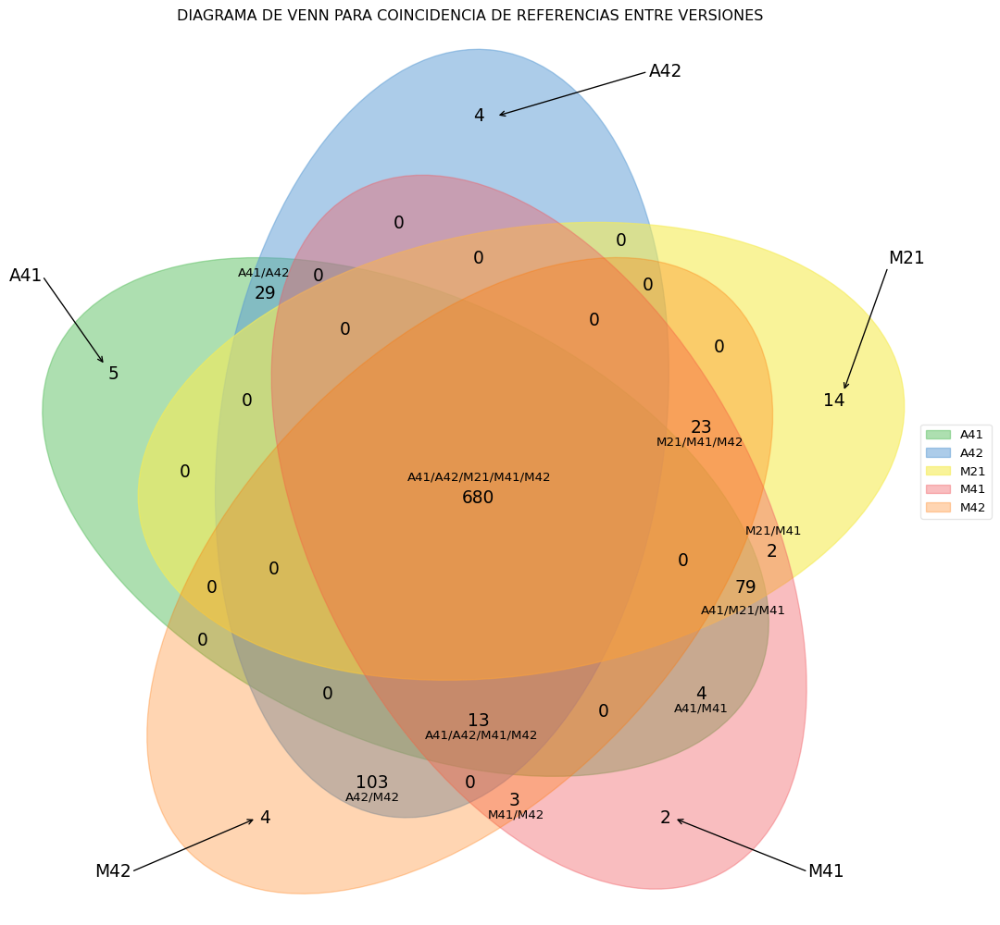

In [ ]:
labels = venn.get_labels([A41, A42, M21, M41, M42], fill=['number'])
fig, ax = venn.venn5(labels, names=['A41', 'A42', 'M21', 'M41', 'M42'])
ax.set_title('DIAGRAMA DE VENN PARA COINCIDENCIA DE REFERENCIAS ENTRE VERSIONES')

ax.annotate('A41/A42', xy=(0.24, 0.72), xytext=(0.24, 0.72))
ax.annotate('M21/M41/M42', xy=(0.71, 0.53), xytext=(0.71, 0.53))
ax.annotate('A41/M21/M41', xy=(0.76, 0.34), xytext=(0.76, 0.34))
ax.annotate('M21/M41', xy=(0.81, 0.43), xytext=(0.81, 0.43))
ax.annotate('A41/M41', xy=(0.73, 0.23), xytext=(0.73, 0.23))
ax.annotate('A41/A42/M41/M42', xy=(0.45, 0.20), xytext=(0.45, 0.20))
ax.annotate('A42/M42', xy=(0.36, 0.13), xytext=(0.36, 0.13))
ax.annotate('M41/M42', xy=(0.52, 0.11), xytext=(0.52, 0.11))
ax.annotate('A41/A42/M21/M41/M42', xy=(0.43, 0.49), xytext=(0.43, 0.49))
plt.annotate('', xy=(0.26, 0.11), xytext=(0.12, 0.05), arrowprops=dict(facecolor='black', arrowstyle='->'))
plt.annotate('', xy=(0.73, 0.11), xytext=(0.88, 0.05), arrowprops=dict(facecolor='black', arrowstyle='->'))
plt.annotate('', xy=(0.09, 0.62), xytext=(0.02, 0.72), arrowprops=dict(facecolor='black', arrowstyle='->'))
plt.annotate('', xy=(0.92, 0.59), xytext=(0.97, 0.73), arrowprops=dict(facecolor='black', arrowstyle='->'))
plt.annotate('', xy=(0.53, 0.90), xytext=(0.70, 0.95), arrowprops=dict(facecolor='black', arrowstyle='->'))
fig.show()

Se generan 5 conjuntos, cada uno correspondiente a una versión. Lo que se ilustra en este gráfico es la cantidad de referencias que coinciden entre estas versiones.

Como se puede ver, tenemos 680 referencias comunes a las 5 versiones (71%), y luego distintas cantidades para cada combinación posible.

Esto sucede porque el producto tiene 3 funcionalidades (X-Y-Z):

X. Puede ser A o M.

Y. Puede ser 4 o 2.

Z. Puede ser 2 o 1.

Por ejemplo, la zona A42/M42 contiene 103. Esto significa que hay 103 referencias que solo utilizan estas dos versiones (por ser las únicas dos con las funcionalidades Y=4 y Z=2 a la vez).

Por otro lado, la zona A41/A42 contiene 29. En este caso hay 29 referencias que solo utilizan estas dos versiones (por ser las únicas dos con las funcionalidades X=A y Y=4) a la vez.

Los modelos A42/M21 no tienen nada en común, no comparten referencias en ningún cruce, salvo en el central que son las referencias comunes a todas las versiones. Profundizaremos en estos temas más adelante.

###4.5 - Graficamos cuantos pallets de cada tipo pertenecen a cada clase, promediando por versión

A continuación el análisis, un pequeño glosario y un par de gráficos.

In [ ]:
DSNX_5 = DSNX.pivot_table(index=['VERSION','CLASE'], columns='TIPO PALLET', values='VOLUMEN CAJA/REF', aggfunc='sum') #Calculo el volumen total por clase, por versión
DSNX_5 = DSNX_5.fillna(0)
DSNX_5 = DSNX_5.groupby('CLASE').mean() #Promedio las versiones
DSNX_5 = DSNX_5/VOL_PALLET
DSNX_5 = DSNX_5.apply(np.ceil) #Redondeo para arriba
DSNX_5

TIPO PALLET,DEDICADO,DIRECTO,MIXTO
CLASE,,,
A,0.0,21.0,1.0
CA1,4.0,0.0,7.0
CA2,4.0,0.0,5.0
CA3,4.0,0.0,7.0
CA4,3.0,0.0,9.0
CA5,7.0,0.0,6.0
CA6,27.0,0.0,5.0
CA7,11.0,0.0,7.0
CH1,12.0,200.0,2.0


In [ ]:
DSNX_IND[(DSNX_IND['COLUMNA']=='CLASE') | (DSNX_IND['COLUMNA']=='CANT PALLETS') | (DSNX_IND['COLUMNA']=='TIPO PALLET') | (DSNX_IND['COLUMNA']=='VERSION') | (DSNX_IND['COLUMNA']=='VOL TOTAL')]

,COLUMNA,DESCRIPCIÓN,EJEMPLO 1,EJEMPLO 2
0,CLASE,Sector en el cual se ensambla esta pieza,F1,A
1,VERSION,Versión del producto al cual pertenece esta pieza,M42,A42
22,VOL TOTAL,Vol. que ocupa esta referencia en su clase,0.1356,0.156
23,CANT PALLETS,Cantidad de pallets que representa el VOL TOTAL,1,3
24,TIPO PALLET,"Indica pallet dedicado, mixto o directo",DIRECTO,DEDICADO


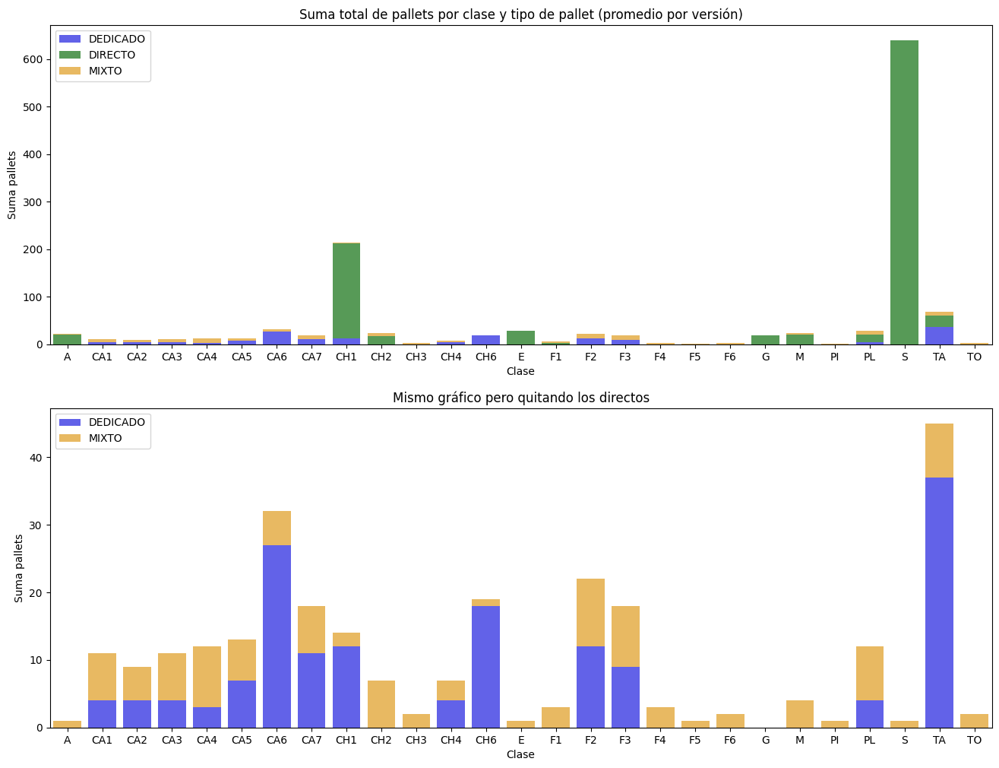

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 12))
sns.barplot(data=DSNX_5, x=DSNX_5.index, y='DEDICADO', color='blue', label='DEDICADO', alpha=0.7, ax=ax1)
sns.barplot(data=DSNX_5, x=DSNX_5.index, y='DIRECTO', color='green', label='DIRECTO', alpha=0.7, bottom=DSNX_5['DEDICADO'], ax=ax1)
sns.barplot(data=DSNX_5, x=DSNX_5.index, y='MIXTO', color='orange', label='MIXTO', alpha=0.7, bottom=DSNX_5['DEDICADO'] + DSNX_5['DIRECTO'], ax=ax1)

sns.barplot(data=DSNX_5, x=DSNX_5.index, y='DEDICADO', color='blue', label='DEDICADO', alpha=0.7, ax=ax2)
sns.barplot(data=DSNX_5, x=DSNX_5.index, y='MIXTO', color='orange', label='MIXTO', alpha=0.7, bottom=DSNX_5['DEDICADO'], ax=ax2)

ax1.set_title('Suma total de pallets por clase y tipo de pallet (promedio por versión)')
ax1.set_xlabel('Clase')
ax1.set_ylabel('Suma pallets')
ax1.legend()

ax2.set_title('Mismo gráfico pero quitando los directos')
ax2.set_xlabel('Clase')
ax2.set_ylabel('Suma pallets')
ax2.legend()

Las clases "S" y "CH1" conllevan gran cantidad de pallets directos, esto sucede porque suelen estar compuestos por referencias que conllevan gran volumen, son piezas estructurales del producto.

Luego repetimos el mismo gráfico pero quitando los directos, para que se aprecie mejor la distribución entre dedicados y mixtos. Ya en este gráfico se empieza a dejar ver cuales son las clases que requerirán más espacio de almacenamiento.

###4.6 - Graficamos un mapa de calor para ver la diferencia entre versiones

A continuación el análisis, un pequeño glosario y el gráfico.

In [ ]:
#El objetivo aqui fue generar una matriz con la versión como índice y como columna, para poder ver la diferencia de piezas de versión a versión
DSNX_6 = pd.DataFrame(index=DSNX_4.columns[:5], columns=DSNX_4.columns[:5])
total=0
for k in DSNX_4.columns[:5]:
  for j in DSNX_4.columns[:5]:
    for i in DSNX_4.index:
      if DSNX_4.loc[i,j]!=DSNX_4.loc[i,k]:
        total+=1 #Voy recorriendo el DSNX_4 para cada par de versiones, si las dos valen 1 o 0, significa que ambas usan (o no) la referencia. Por ello solo sumo uno si los valores difieren
    DSNX_6.loc[k,j]=total
    total=0
DSNX_6 = DSNX_6.astype(float)
DSNX_6

VERSION,A41,A42,M21,M41,M42
VERSION,,,,,
A41,0.0,195.0,90.0,64.0,250.0
A42,195.0,0.0,267.0,249.0,63.0
M21,90.0,267.0,0.0,36.0,218.0
M41,64.0,249.0,36.0,0.0,194.0
M42,250.0,63.0,218.0,194.0,0.0


In [ ]:
DSNX_IND[(DSNX_IND['COLUMNA']=='REFERENCIA') | (DSNX_IND['COLUMNA']=='VERSION')]

,COLUMNA,DESCRIPCIÓN,EJEMPLO 1,EJEMPLO 2
1,VERSION,Versión del producto al cual pertenece esta pieza,M42,A42
15,REFERENCIA,Código de esta pieza,2804110-BU01,6900006P201D


Text(0.5, 1.0, 'DIFERENCIA DE USO DE REFERENCIAS ENTRE VERSIONES')

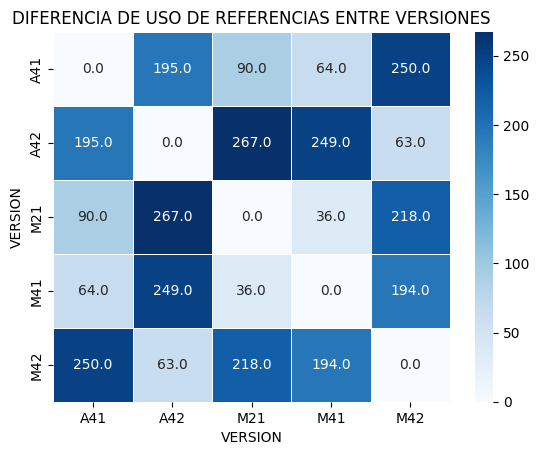

In [ ]:
sns.heatmap(DSNX_6,annot=True,fmt=".1f",linewidth=.5,cmap="Blues")
plt.title('DIFERENCIA DE USO DE REFERENCIAS ENTRE VERSIONES')

Obviamente la diagonal valdrá 0 ya que sería una comparación entre la misma versión, luego vemos que la que tiene más diferencias es la M21 con la A42.

Como se expicó anteriormente, esto tiene sentido ya que cada versión consta de 3 funciones. Las versiones A41 y A42 difieren solo en una función, mientras que las M21 y A42 difieren en las tres funciones (por ello son las que más difieren en las referencias que usan).

###4.7 - Insights y conclusión

1)	Las clases contienen más o menos la misma cantidad de referencias distintas. Solo la clase “TO” sobresale.

2)	La mayoría de las referencias vienen en su totalidad en 1-4 cajas. Solo algunas puntuales vienen en más cantidad.

3)	El punto anterior no varía versión a versión, las distribuciones son iguales.

4)	Las bases no inspeccionables traen pocas cajas, salvo excepciones. Las inspeccionables, lo opuesto.

5)	El punto anterior prácticamente no varía versión a versión.

6)	La cantidad de contenedores por versión es la misma.

7)	El 71% de las referencias son comunes a todas las versiones, el 29% restante son las que se usan dependiendo de las funcionalidades X-Y-Z.

8)	Las clases “S” y “CH1” son las que más pallets directos llevan.

9)	Entre más funcionalidades compartan dos versiones, más piezas en común tendrán.


#5 - Predicción de packaging de cajas (usando modelos sup. de ML)

##5.1 - Feature engineering

###5.1.1 - Selección de variables de interés

En esta etapa del proyecto analizaremos el packaging de las cajas.

Muchas veces sucede que, debido a roturas, logística tenga que pedir puntualmente al proveedor cajas con piezas para realizar reemplazos.

En virtud de esto, es de interés saber si es posible predecir que tipo de packaging enviará el proveedor, en función del contenido que tendrá la caja (o sea en función del pedido de piezas a reponer).

Tener esta información ayudaría a preparar de manera anticipada, las condiciones de almacenamiento necesarias para dicho arribo de producto.

A su vez, poder deducir el criterio que usa el proveedor para seleccionar el packaging, podría ayudar a dar recomendaciones al mismo de cómo mejorarlo.

In [ ]:
DSNX_7 = DSNX[['VERSION','CAJA','PESO CAJA','VOLUMEN CAJA','UNID/CAJA','REFS/CAJA','TIPO CAJA']] #Me quedo con las columnas que me interesan del DS original.
DSNX_7

,VERSION,CAJA,PESO CAJA,VOLUMEN CAJA,UNID/CAJA,REFS/CAJA,TIPO CAJA
0,M42,AF0001,153.92,0.022100,16,1,IRON FRAME
1,M42,AF0002,153.92,0.022100,16,1,IRON FRAME
2,M42,AF0003,153.92,0.022100,16,1,IRON FRAME
3,M42,AF0004,153.92,0.022100,16,1,IRON FRAME
4,M42,AF0005,153.92,0.022100,16,1,IRON FRAME
...,...,...,...,...,...,...,...
23599,A42,MC0074,6.81,0.091080,96,4,CARTON
23600,A42,MC0074,6.81,0.091080,96,4,CARTON
23601,A42,MC0074,6.81,0.091080,96,4,CARTON
23602,A42,MC0074,6.81,0.091080,96,4,CARTON


La información del DS original que nos servirá, deberá tener que ver con cajas. Por ese motivo es que descartamos las columnas clase, contenedor y todo lo relacionado a bases o pallets. A su vez, el código de la referencia tampoco será de ayuda, ya que lo importante será el peso y volumen de la misma.

Siguiendo esta idea, nos quedarían las columnas con las que estamos trabajando. Cuando logística quiera hacer un pedido, deberá contar con el peso total de lo que va a pedir, el volumen, la cantidad de unidades y cuantas referencias distintas estará pidiendo.

En cuanto a valores faltantes o atípicos, no debemos preocuparnos ya que fueron depurados en secciones anteriores.

Por otra parte, cabe destacar que en el DS tenemos cajas repetidas. Esto sucede porque algunas de ellas traen más de una referencia dentro, y esta información se subdivide en varias filas, veamos un ejemplo.

In [ ]:
DSNX[(DSNX['CAJA']=='AC1077') & (DSNX['VERSION']=='M42')]

,CLASE,VERSION,CONTENEDOR,BASE,TIPO BASE,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJA,...,UNID/CAJA,CAJAS/BASE,REFS/BASE,CLASES/BASE,INSPECCIÓN,REFS/CAJA,VOLUMEN CAJA,VOLUMEN CAJA/REF,VOL TOTAL,TIPO PALLET
489,F5,M42,CMAU8944850,AF0091,IRON FRAME,1700,650,1250,639.21,AC1077,...,24,39,10,6,1,3,0.0576,0.0192,0.0768,MIXTO
490,F5,M42,CMAU8944850,AF0091,IRON FRAME,1700,650,1250,639.21,AC1077,...,24,39,10,6,1,3,0.0576,0.0192,0.0768,MIXTO
491,F5,M42,CMAU8944850,AF0091,IRON FRAME,1700,650,1250,639.21,AC1077,...,24,39,10,6,1,3,0.0576,0.0192,0.0768,MIXTO


En el ejemplo anterior, tenemos 3 referencias en la caja AC1077. En la columna REFS/CAJA vemos el valor 3, y en la columna UNID/CAJA indica que hay 24 de cada una dentro.

Por este motivo, haremos un cálculo para determinar realmente el número de unidades por caja, que en este ejemplo sería 24*3=72.

In [ ]:
DSNX_7['UNID/CAJA'] = DSNX_7.groupby(['VERSION','CAJA'])['UNID/CAJA'].transform('sum') #Agrupo por caja y sumo unidades
DSNX_7

,VERSION,CAJA,PESO CAJA,VOLUMEN CAJA,UNID/CAJA,REFS/CAJA,TIPO CAJA
0,M42,AF0001,153.92,0.022100,16,1,IRON FRAME
1,M42,AF0002,153.92,0.022100,16,1,IRON FRAME
2,M42,AF0003,153.92,0.022100,16,1,IRON FRAME
3,M42,AF0004,153.92,0.022100,16,1,IRON FRAME
4,M42,AF0005,153.92,0.022100,16,1,IRON FRAME
...,...,...,...,...,...,...,...
23599,A42,MC0074,6.81,0.091080,384,4,CARTON
23600,A42,MC0074,6.81,0.091080,384,4,CARTON
23601,A42,MC0074,6.81,0.091080,384,4,CARTON
23602,A42,MC0074,6.81,0.091080,384,4,CARTON


In [ ]:
DSNX_7 = DSNX_7.drop_duplicates(subset=['VERSION', 'CAJA']) #Borro cajas duplicadas
DSNX_7 = DSNX_7.reset_index(drop=True)
DSNX_7

,VERSION,CAJA,PESO CAJA,VOLUMEN CAJA,UNID/CAJA,REFS/CAJA,TIPO CAJA
0,M42,AF0001,153.92,0.022100,16,1,IRON FRAME
1,M42,AF0002,153.92,0.022100,16,1,IRON FRAME
2,M42,AF0003,153.92,0.022100,16,1,IRON FRAME
3,M42,AF0004,153.92,0.022100,16,1,IRON FRAME
4,M42,AF0005,153.92,0.022100,16,1,IRON FRAME
...,...,...,...,...,...,...,...
22157,A42,MC0071,13.85,0.212000,16,1,CARTON
22158,A42,MC0072,13.85,0.212000,16,1,CARTON
22159,A42,MC0073,13.85,0.212000,16,1,CARTON
22160,A42,MC0074,6.81,0.091080,384,4,CARTON


In [ ]:
DSNX_7[(DSNX_7['CAJA']=='AC1077') & (DSNX_7['VERSION']=='M42')] #Chequeo que quedó ok, como comenté antes, el valor correcto debería ser 72 unid/caja y 3 ref/caja

,VERSION,CAJA,PESO CAJA,VOLUMEN CAJA,UNID/CAJA,REFS/CAJA,TIPO CAJA
489,M42,AC1077,19.97,0.0576,72,3,CARTON


In [ ]:
reemplazos = {'BUBBLE FILM': 1, 'CARTON': 2, 'IRON FRAME': 3, 'IRON TRAY': 4, 'WOOD FRAME':5} #Reemplazo los strings por números para comenzar a trabajar
DSNX_7['TIPO CAJA ORIGINAL'] = DSNX_7['TIPO CAJA']
DSNX_7['TIPO CAJA'] = DSNX_7['TIPO CAJA'].replace(reemplazos)
DSNX_7

,VERSION,CAJA,PESO CAJA,VOLUMEN CAJA,UNID/CAJA,REFS/CAJA,TIPO CAJA,TIPO CAJA ORIGINAL
0,M42,AF0001,153.92,0.022100,16,1,3,IRON FRAME
1,M42,AF0002,153.92,0.022100,16,1,3,IRON FRAME
2,M42,AF0003,153.92,0.022100,16,1,3,IRON FRAME
3,M42,AF0004,153.92,0.022100,16,1,3,IRON FRAME
4,M42,AF0005,153.92,0.022100,16,1,3,IRON FRAME
...,...,...,...,...,...,...,...,...
22157,A42,MC0071,13.85,0.212000,16,1,2,CARTON
22158,A42,MC0072,13.85,0.212000,16,1,2,CARTON
22159,A42,MC0073,13.85,0.212000,16,1,2,CARTON
22160,A42,MC0074,6.81,0.091080,384,4,2,CARTON


Para X (variables independientes) me quedo solamente con las columnas PESO CAJA, VOLUMEN CAJA, UNID/CAJA y REFS/CAJA.

Para Y (variable dependiente) con la columna TIPO CAJA.

###5.1.2 - Correlación entre variables

Ahora, apliquemos regresión a cada par de variables independientes, y generemos una matriz con los R2 y BETAS de cada par. De esta forma podremos chequear que tan independienes son entre sí.

Text(0.5, 1.0, 'BETA DE CADA PAR DE VARIABLES')

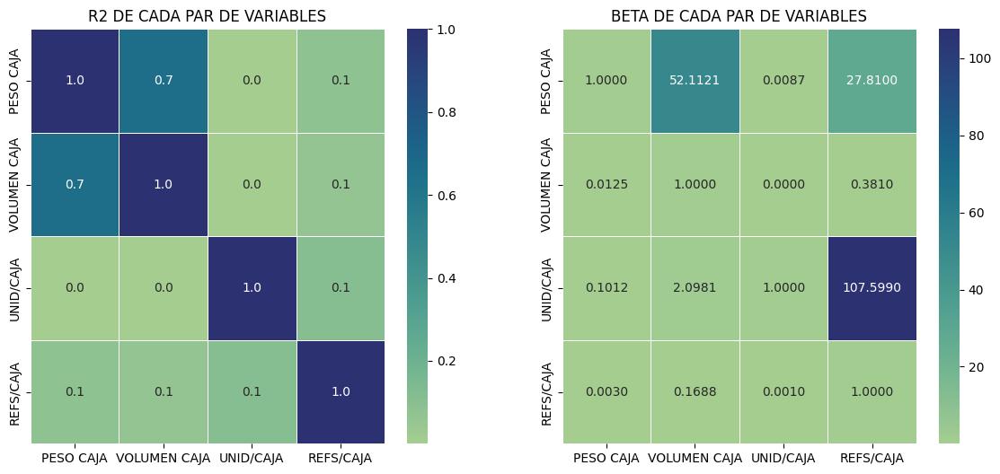

In [ ]:
R2 = pd.DataFrame(index=DSNX_7.columns[2:6], columns=DSNX_7.columns[2:6])
BETAS = pd.DataFrame(index=DSNX_7.columns[2:6], columns=DSNX_7.columns[2:6])
for i in DSNX_7.columns[2:6]:
  for j in DSNX_7.columns[2:6]:
    model = sm.OLS(DSNX_7[i], DSNX_7[j]).fit()
    R2.loc[i,j]=model.rsquared
    BETAS.loc[i,j]=model.params[j]

R2 = R2.astype(float)
BETAS = BETAS.astype(float)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(R2,ax=ax1,annot=True, fmt=".1f", linewidth=.5, cmap="crest")
ax1.set_title('R2 DE CADA PAR DE VARIABLES')
sns.heatmap(BETAS,ax=ax2,annot=True, fmt=".4f", linewidth=.5, cmap="crest")
ax2.set_title('BETA DE CADA PAR DE VARIABLES')

Como vemos, en el único par que encontramos algo de relación es entre el peso y el volumen, cosa que en realidad es bastante lógica. Con respecto a lo demás, no hay relaciones claras.

También podemos hacer la matriz de correlación para verlo resumido gráficamente.

Text(0.5, 1.0, 'MATRIZ DE CORRELACIÓN')

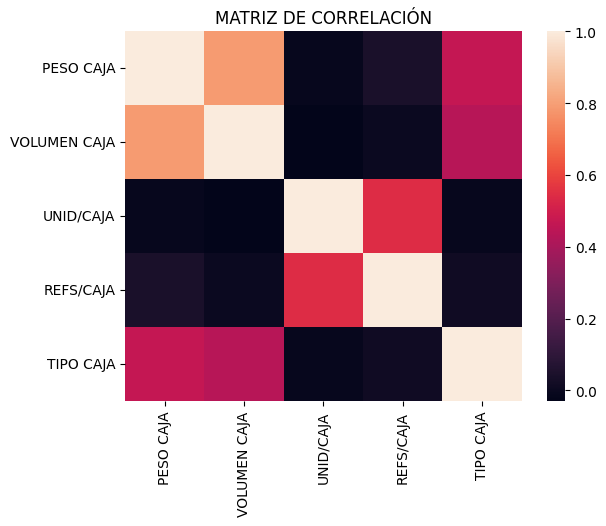

In [ ]:
sns.heatmap(DSNX_7.corr())
plt.title('MATRIZ DE CORRELACIÓN')



Continuando, apliquemos PCA para reducir la dimensionalidad.

###5.1.3 - Aplicación de PCA

In [ ]:
pca_obj = PCA() #Aplico PCA
PCA_DSNX_7 = pd.DataFrame(pca_obj.fit_transform(DSNX_7.iloc[:,2:6]))
PCA_DSNX_7

,0,1,2,3
0,-37.181593,121.341510,1.943245,-0.096774
1,-37.181593,121.341510,1.943245,-0.096774
2,-37.181593,121.341510,1.943245,-0.096774
3,-37.181593,121.341510,1.943245,-0.096774
4,-37.181593,121.341510,1.943245,-0.096774
...,...,...,...,...
22157,-36.673020,-18.714611,0.029628,-0.039908
22158,-36.673020,-18.714611,0.029628,-0.039908
22159,-36.673020,-18.714611,0.029628,-0.039908
22160,331.351874,-24.418270,0.075670,2.738621


In [ ]:
pca_obj.explained_variance_ratio_ #Veo que con las dos primeras columnas me quedo aproximadamente con el 100% de la info.

array([9.25498636e-01, 7.44937909e-02, 6.77862582e-06, 7.94971311e-07])

In [ ]:
PCA_DSNX_7 = PCA_DSNX_7.drop([2,3], axis=1) #Elimino columna 2 y 3
PCA_DSNX_7

,0,1
0,-37.181593,121.341510
1,-37.181593,121.341510
2,-37.181593,121.341510
3,-37.181593,121.341510
4,-37.181593,121.341510
...,...,...
22157,-36.673020,-18.714611
22158,-36.673020,-18.714611
22159,-36.673020,-18.714611
22160,331.351874,-24.418270


##5.2 - Entrenamiento, validación y testeo

###5.2.1 - Decision Tree Classifier

Ahora sí, divido el DS en uno para entrenar, uno para validar y otro para testear:

In [ ]:
x_trainval, x_test, y_trainval, y_test = train_test_split(PCA_DSNX_7,DSNX_7.iloc[:,6], test_size=0.30, random_state=42, stratify=DSNX_7.iloc[:,6]) #Divido DS en trainval y test
x_train, x_val, y_train, y_val = train_test_split(x_trainval,y_trainval, test_size=0.30, random_state=42, stratify=y_trainval) #Divido el trainval en val y train
print('Dimensiones matriz de entrenamiento:',x_train.shape)
print('Dimensiones matriz de testeo:',x_test.shape)
print('Dimensiones matriz de validación:',x_val.shape)

Dimensiones matriz de entrenamiento: (10859, 2)
Dimensiones matriz de testeo: (6649, 2)
Dimensiones matriz de validación: (4654, 2)


Para no perder el hilo, es importante recordar lo que estamos queriendo realizar aquí.

La idea es poder predecir en qué packaging el proveedor enviará el pedido que logística tenga que hacerle para cubrir alguna rotura de piezas.

Como ejemplo práctico, supongamos que logística quiere pedir un envío especial de 2 tipos de referencias.

Como se explicó antes, para entrenar el modelo usamos la información del peso y volumen de cada caja. Cuando logística quiera pedir esta reposición de piezas, no va a tener estos datos, lo único que tendrá es un ejemplo de cada pieza que deba reponer, por lo que deberá:

1) Pesar la referencia A y la referencia B.

2) Calcular el volumen de la referencia A y de la referencia B.

3) Multiplicar dichos valores por la cantidad a pedir de cada una.

Con esto tendremos un valor de cuanto pesará el pedido y qué volumen ocupa en función de las referencias sueltas, ya que no tenemos la caja. Con esta información si podremos entrar al modelo e intentar predecir el tipo de caja.

1) Referencia A:

  Cantidad: 48 - Peso: 0.2kg c/u - Volumen: 0.006m3 c/u
  
2) Referencia B:

  Cantidad: 20 - Peso: 0.5kg c/u - Volumen: 0.010m3 c/u

Veámoslo resumido.

In [ ]:
prueba = pd.DataFrame(columns=DSNX_7.columns[2:6])
prueba.loc[0,'PESO CAJA'] = 0.2*48 + 0.5*20
prueba.loc[0,'VOLUMEN CAJA'] = 0.006*48 + 0.010*20
prueba.loc[0,'UNID/CAJA'] = 48 + 20
prueba.loc[0,'REFS/CAJA'] = 2
prueba

,PESO CAJA,VOLUMEN CAJA,UNID/CAJA,REFS/CAJA
0,19.6,0.488,68,2


Con esta información deberíamos entrar al modelo.

Cerrando la idea, por todo esto fue que aplicamos PCA a esas columnas y no a todas; el nombre de la caja no es relevante, y la versión tampoco, ya que como vimos en el EDA, no hay grandes variaciones en la distribución de cajas yendo versión a versión.

In [ ]:
modelo_arbol = DecisionTreeClassifier() #Entreno
modelo_arbol.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
y_predict = modelo_arbol.predict(x_val) #Valido
y_predict

array([2, 2, 2, ..., 2, 2, 1])

In [ ]:
confusion = pd.DataFrame(index=['TP','FP','TN','FN'], columns=range(1,6)) #Armo una matriz para colocar los valores de la matriz de confusión por tipo de packaging
confusion[:] = 0
for j,k in zip(y_val,y_predict): #Voy iterando con los valores de la columna del dato real y la predicha
  if j==k:
    for i in confusion.columns:
      if i==j:
        confusion.loc['TP',i] += 1
      else:
        confusion.loc['TN',i] += 1
  else:
    for i in confusion.columns:
      if i==j:
        confusion.loc['FN',i] += 1
      elif i==k:
        confusion.loc['FP',i] += 1
      else:
        confusion.loc['TN',i] += 1
confusion #Printeo la matriz de confusión para ver como le fue al modelo

,1,2,3,4,5
TP,208,4070,307,7,55
FP,4,3,0,0,0
TN,4440,577,4347,4646,4599
FN,2,4,0,1,0


Text(0.5, 1.0, 'MATRIZ DE CONFUSIÓN')

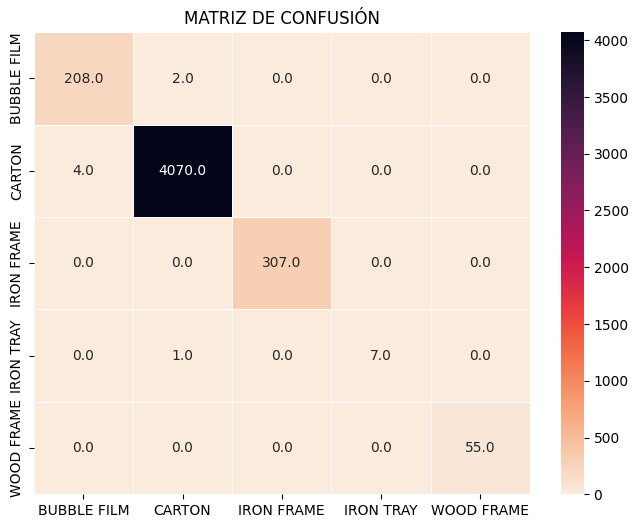

In [ ]:
cm = confusion_matrix(y_val,y_predict)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt=".1f", linewidth=.5, cmap="rocket_r", xticklabels=reemplazos.keys(), yticklabels=reemplazos.keys())
plt.title('MATRIZ DE CONFUSIÓN') #Genero la matriz de confusión de manera gráfica

La zona diagonal son los TP (verdaderos positivos), el resto de los valores representan tanto FP como FN.

Vemos que en general el modelo acierta el tipo de packaging, ya que la diagonal es la zona que tiene más cantidad de datos.

Ahora calculemos las métricas, para tener un valor certero de desempeño.

###5.2.2 - Métricas de desempeño

In [ ]:
metricas = pd.DataFrame(index=['Precision','Recall','Accuracy','Specificity','F1'], columns=range(1,6)) #Creo una matriz para almacenar las métricas por tipo de packaging
for i in metricas.columns:
  metricas.loc['Precision',i] = confusion.loc['TP',i] / (confusion.loc['TP',i] + confusion.loc['FP',i])
  metricas.loc['Recall',i] = confusion.loc['TP',i] / (confusion.loc['TP',i] + confusion.loc['FN',i])
  metricas.loc['Accuracy',i] = (confusion.loc['TP',i] + confusion.loc['TN',i]) / confusion[i].sum()
  metricas.loc['Specificity',i] = confusion.loc['TN',i] / (confusion.loc['TN',i] + confusion.loc['FP',i])
  try:
    metricas.loc['F1',i] = 2 * metricas.loc['Recall',i] * metricas.loc['Precision',i] / (metricas.loc['Recall',i] + metricas.loc['Precision',i])
  except:
    metricas.loc['F1',i] = 0
metricas.columns = reemplazos.keys()
metricas['Promedio'] = metricas.mean(axis=1)
metricas #Printeo la matriz completa

,BUBBLE FILM,CARTON,IRON FRAME,IRON TRAY,WOOD FRAME,Promedio
Precision,0.981132,0.999263,1.0,1.0,1.0,0.996079
Recall,0.990476,0.999018,1.0,0.875,1.0,0.972899
Accuracy,0.998711,0.998496,1.0,0.999785,1.0,0.999398
Specificity,0.9991,0.994828,1.0,1.0,1.0,0.998785
F1,0.985782,0.999141,1.0,0.933333,1.0,0.983651


Así serían los resultados de las métricas calculados individualmente, calculemos ahora métricas más generales utilizando la librería.

In [ ]:
metricas.loc['Precision','Sklearn Metrics'] = precision_score(y_val,y_predict,average='macro')
metricas.loc['Recall','Sklearn Metrics'] = recall_score(y_val,y_predict,average='macro')
metricas.loc['Accuracy','Sklearn Metrics'] = accuracy_score(y_val,y_predict)
metricas.loc['Specificity','Sklearn Metrics'] = 'S/D'
metricas.loc['F1','Sklearn Metrics'] = f1_score(y_val,y_predict,average='macro')
metricas

,BUBBLE FILM,CARTON,IRON FRAME,IRON TRAY,WOOD FRAME,Promedio,Sklearn Metrics
Precision,0.981132,0.999263,1.0,1.0,1.0,0.996079,0.996079
Recall,0.990476,0.999018,1.0,0.875,1.0,0.972899,0.972899
Accuracy,0.998711,0.998496,1.0,0.999785,1.0,0.999398,0.998496
Specificity,0.9991,0.994828,1.0,1.0,1.0,0.998785,S/D
F1,0.985782,0.999141,1.0,0.933333,1.0,0.983651,0.983651


Como la librería no nos da la posibilidad de calcular la Specificity, nos queda vacío ese dato.

En cuanto al resto, los resultados práctiamente no varían.

Probemos con otro modelo.

###5.2.3 - Random Forest Classifier

In [ ]:
modelo_arbol2 = RandomForestClassifier() #Entreno
modelo_arbol2.fit(x_train,y_train)

RandomForestClassifier()

In [ ]:
y_predict2 = modelo_arbol2.predict(x_val) #Valido
y_predict2

array([2, 2, 2, ..., 2, 2, 1])

In [ ]:
metricas = metricas.drop(['BUBBLE FILM','CARTON','IRON FRAME','IRON TRAY','WOOD FRAME','Promedio'], axis=1)
metricas = metricas.rename(columns={'Sklearn Metrics': 'Decision Tree VAL'})
metricas.loc['Precision','Random Forest VAL'] = precision_score(y_val,y_predict2,average='macro')
metricas.loc['Recall','Random Forest VAL'] = recall_score(y_val,y_predict2,average='macro')
metricas.loc['Accuracy','Random Forest VAL'] = accuracy_score(y_val,y_predict2)
metricas.loc['Specificity','Random Forest VAL'] = 'S/D'
metricas.loc['F1','Random Forest VAL'] = f1_score(y_val,y_predict2,average='macro')
metricas

,Decision Tree VAL,Random Forest VAL
Precision,0.996079,0.996012
Recall,0.972899,0.971946
Accuracy,0.998496,0.998281
Specificity,S/D,S/D
F1,0.983651,0.983145


Vemos que, ambos tienen desempeños prácticamente iguales.

Continuaremos utilizando el Random Forest para testear.

###5.2.4 - Testeo del modelo (post-validación)

In [ ]:
modelo_arbol3 = RandomForestClassifier() #Entreno con trainval para aprovechar más datos
modelo_arbol3.fit(x_trainval,y_trainval)

RandomForestClassifier()

In [ ]:
y_predict3 = modelo_arbol3.predict(x_test) #Testeo
y_predict3

array([2, 2, 2, ..., 2, 2, 2])

In [ ]:
metricas.loc['Precision','Random Forest TEST'] = precision_score(y_test,y_predict3,average='macro')
metricas.loc['Recall','Random Forest TEST'] = recall_score(y_test,y_predict3,average='macro')
metricas.loc['Accuracy','Random Forest TEST'] = accuracy_score(y_test,y_predict3)
metricas.loc['Specificity','Random Forest TEST'] = 'S/D'
metricas.loc['F1','Random Forest TEST'] = f1_score(y_test,y_predict3,average='macro')
metricas

,Decision Tree VAL,Random Forest VAL,Random Forest TEST
Precision,0.996079,0.996012,0.945155
Recall,0.972899,0.971946,0.997515
Accuracy,0.998496,0.998281,0.998346
Specificity,S/D,S/D,S/D
F1,0.983651,0.983145,0.967755


Efectivamente el Random Forest tiene muy buen desempeño.

Queda pendiente aún entender como es la lógica que utiliza el proveedor para seleccionar las cajas. Pongámonos a trabajar en ello.

El primer paso será volver a entrenar el modelo pero sin usar PCA, para entender la importancia de cada variable en cuanto a la predicción.

Además, utilizaremos el Decision Tree, ya que nos permite graficar el árbol.

###5.2.5 - Feature importance

Para comenzar, veamos que tan relacionadas están las variables independientes con la dependiente.

In [ ]:
correlacion = DSNX_7.corr()['TIPO CAJA']
print(correlacion)

PESO CAJA       0.466782
VOLUMEN CAJA    0.435586
UNID/CAJA      -0.012969
REFS/CAJA       0.011615
TIPO CAJA       1.000000
Name: TIPO CAJA, dtype: float64


Por lo que parece, las variables más relevantes son el peso y el volumen de la caja. No es tan importante la cantidad y variedad de referencias que contengan.

Teniendo en cuenta esto, desarrollemos un modelo solo con esas dos.

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(DSNX_7.iloc[:,2:4],DSNX_7.iloc[:,6], test_size=0.3, random_state=42, stratify=DSNX_7.iloc[:,6]) #Divido DS en train y test
print('Dimensiones matriz de entrenamiento:',x_train.shape)
print('Dimensiones matriz de testeo:',x_test.shape)

Dimensiones matriz de entrenamiento: (15513, 2)
Dimensiones matriz de testeo: (6649, 2)


In [ ]:
modelo_arbol = DecisionTreeClassifier() #Entreno
modelo_arbol.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
y_predict = modelo_arbol.predict(x_test) #Testeo
y_predict

array([2, 2, 2, ..., 2, 2, 2])

In [ ]:
metricas.loc['Precision','Decision Tree (No PCA)'] = precision_score(y_test,y_predict,average='macro')
metricas.loc['Recall','Decision Tree (No PCA)'] = recall_score(y_test,y_predict,average='macro')
metricas.loc['Accuracy','Decision Tree (No PCA)'] = accuracy_score(y_test,y_predict)
metricas.loc['Specificity','Decision Tree (No PCA)'] = 'S/D'
metricas.loc['F1','Decision Tree (No PCA)'] = f1_score(y_test,y_predict,average='macro')
metricas

,Decision Tree VAL,Random Forest VAL,Random Forest TEST,Decision Tree (No PCA)
Precision,0.996079,0.996012,0.945155,0.946767
Recall,0.972899,0.971946,0.997515,0.998285
Accuracy,0.998496,0.998281,0.998346,0.998947
Specificity,S/D,S/D,S/D,S/D
F1,0.983651,0.983145,0.967755,0.968945


En realidad, comparando con los casos anteriores, no vale tanto la pena aplicar PCA. El modelo utilizando las variables originales ya de por sí, es bastante bueno.

Veamos cuál es la variable más determinante.

In [ ]:
feature_importance = modelo_arbol.feature_importances_ #Calculo el feature importance
FI = pd.DataFrame(index=DSNX_7.columns[2:4])
FI['Feature Importance'] = feature_importance
FI

,Feature Importance
PESO CAJA,0.128829
VOLUMEN CAJA,0.871171


In [ ]:
fig = px.pie(FI, values='Feature Importance', names=DSNX_7.columns[2:4], title='GRÁFICO FEATURE IMPORTANCE', color_discrete_sequence=px.colors.sequential.Redor)
fig.show()

Según el modelo, el factor más determinante es el volumen de la caja.

Otro punto interesante a analizar es graficar las variables, para ver si hay alguna relación que salte a la vista.

In [ ]:
DSNX_7['AUX'] = DSNX_7['VERSION'] + ' / ' + DSNX_7['CAJA']
fig = px.scatter(DSNX_7, x='PESO CAJA', y='VOLUMEN CAJA', symbol='TIPO CAJA ORIGINAL', color='TIPO CAJA ORIGINAL', hover_name='AUX')
fig.show()

A simple vista vemos:

Volumen bajo y Peso bajo/medio bajo - Cartón

Volumen medio bajo y Peso bajo - Bubble film

Volumen medio bajo y Peso medio bajo - Iron tray

Volumen medio bajo y Peso medio alto - Wood frame

El resto es Iron frame.

Aún así, tenemos algunos puntos "desubicados" en el diagrama. Veamos el árbol de decisión para entender esto mejor.

In [ ]:
label = ['BUBBLE FILM','CARTON','IRON FRAME','IRON TRAY','WOOD FRAME']
plt.figure(figsize=(240, 80))
plot_tree(modelo_arbol, feature_names=x_train.columns, class_names=label, impurity=False, filled=True, max_depth=4)
circulo = Circle((0.53, 0.25), 0.035, color='red', fill=False, linewidth=10)
plt.gca().add_patch(circulo)
plt.show()

Con el árbol a la vista podemos entender mejor cual es la lógica que utiliza el proveedor a la hora de seleccionar el packaging.

Llama la atención algunas decisiones que toman, como por ejemplo la marcada con el círculo rojo. Según el modelo, si la mercadería ocupa un volumen entre 1.05 y 1.147 m3, y además pesa más de 142.095kg, va en caja de cartón. Este peso es ridículo para un packaging de ese tipo, obviamente se va a terminar rompiendo.

Aquí tenemos solo un ejemplo de todas las mejoras que se podrían implementar estudiando mejor este diagrama.

##5.3 - Insights y conclusión

1) El modelo realmente funciona muy bien, las métricas dieron estupendo.

2) Podemos concluir entonces que, sabiendo el peso y volumen total de un pedido, podremos predecir de forma muy buena en qué tipo de packaging vendrá la mercadería.

3) Haber hecho el diagrama del árbol solo con las variables más relevantes y sin aplicar PCA, nos da la posibilidad de entender la lógica de elección de packaging del proveedor, y en función de eso recomendar mejoras.

#6 - Clasificación de bases (usando modelos no sup. de ML)

A continuación, intentaremos abordar otra de las preguntas que nos hicimos al inicio: Existe algún patrón entre las bases? Se pueden clasificar?

Para esto utilizaremos modelos de machine learning no supervisados.

##6.1 - Feature engineering

Preparemos los datos.

###6.1.1 - Selección de variables de interés

El primer paso será extraer del DS original las columnas que serán relevantes para el análisis. Estas serán las que tengan que ver con bases.

Además extraerémos la versión, la cual será útil más adelante.

En cuanto a valores faltantes o atípicos, no debemos preocuparnos ya que fueron depurados en secciones anteriores.

In [ ]:
DSNX_10 = DSNX[['VERSION','BASE','TIPO BASE','LARGO BASE','ANCHO BASE','ALTURA BASE','PESO BASE','CAJAS/BASE','REFS/BASE','CLASES/BASE']] #Me quedo con las columnas que tienen información sobre las bases
DSNX_10

,VERSION,BASE,TIPO BASE,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJAS/BASE,REFS/BASE,CLASES/BASE
0,M42,AF0001,IRON FRAME,2110,600,1200,205.0,1,1,1
1,M42,AF0002,IRON FRAME,2110,600,1200,205.0,1,1,1
2,M42,AF0003,IRON FRAME,2110,600,1200,205.0,1,1,1
3,M42,AF0004,IRON FRAME,2110,600,1200,205.0,1,1,1
4,M42,AF0005,IRON FRAME,2110,600,1200,205.0,1,1,1
...,...,...,...,...,...,...,...,...,...,...
23599,A42,MP001,IRON FRAME,2250,1700,1050,861.0,94,54,1
23600,A42,MP001,IRON FRAME,2250,1700,1050,861.0,94,54,1
23601,A42,MP001,IRON FRAME,2250,1700,1050,861.0,94,54,1
23602,A42,MP001,IRON FRAME,2250,1700,1050,861.0,94,54,1


Como cada fila representa una caja (y cada base tiene muchas), tenemos muchas filas que hacen referencia a la misma base.

A su vez, los nombres de las bases se repiten de versión a versión, aunque su contenido no es el mismo. Por ello, debemos borrar duplicados de versión y base.

Por último, extraerémos el prefijo de cada base, ya que puede ser un dato interesante.

In [ ]:
DSNX_10 = DSNX_10.drop_duplicates(subset=['VERSION', 'BASE']) #Los nombres de las bases se repiten por versión, por eso para quedarme con las bases únicas, tengo que hacerlo así
DSNX_10['PREFIJO'] = DSNX_10['BASE'].str[:2] #El nombre de la base no me sirve, el prefijo puede que si
DSNX_10 = DSNX_10.drop(['VERSION','BASE'], axis=1) #Borro las columnas que ya no sirven
DSNX_10 = DSNX_10.reset_index(drop=True) #Reinicio índice
DSNX_10

,TIPO BASE,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJAS/BASE,REFS/BASE,CLASES/BASE,PREFIJO
0,IRON FRAME,2110,600,1200,205.00,1,1,1,AF
1,IRON FRAME,2110,600,1200,205.00,1,1,1,AF
2,IRON FRAME,2110,600,1200,205.00,1,1,1,AF
3,IRON FRAME,2110,600,1200,205.00,1,1,1,AF
4,IRON FRAME,2110,600,1200,205.00,1,1,1,AF
...,...,...,...,...,...,...,...,...,...
2360,IRON FRAME,2250,1800,1000,406.57,1,1,1,MF
2361,IRON FRAME,2250,1800,1000,740.00,3,3,1,MF
2362,IRON FRAME,2250,1800,1000,664.00,1,1,1,MF
2363,IRON FRAME,2250,1800,1000,616.44,2,2,1,MF


###6.1.2 - Encoder y normalización

Ahora que tenemos los datos, comencemos la preparación para presentarlos a los modelos.

El primer paso será aplicar One Hot Encoder a las variables categóricas.

In [ ]:
DSNX_10['TIPO BASE'].value_counts()

IRON FRAME    1670
IRON TRAY      670
WOOD FRAME      25
Name: TIPO BASE, dtype: int64

In [ ]:
DSNX_10['PREFIJO'].value_counts()

GF    1035
AP     666
AF     449
HF     150
MF      35
AW      25
MP       5
Name: PREFIJO, dtype: int64

Según lo visto, generaremos 8 columnas a partir de 2 que ya tenemos (en realidad serían 10, pero 2 podemos descartarlas con el parámetro drop, por ser combinación lineal de las demás).

In [ ]:
col_cat = ['TIPO BASE','PREFIJO'] #Mis columnas categóricas
ohe = OneHotEncoder(sparse_output=False, drop='first') #Aplico OHE, dropeo las columnas que no aportan
DSNX_10_cat = ohe.fit_transform(DSNX_10[col_cat])
DSNX_10_cat = pd.DataFrame(DSNX_10_cat, columns=ohe.get_feature_names_out())
DSNX_10_cat #Así hago OneHotEncoder a las categóricas

,TIPO BASE_IRON TRAY,TIPO BASE_WOOD FRAME,PREFIJO_AP,PREFIJO_AW,PREFIJO_GF,PREFIJO_HF,PREFIJO_MF,PREFIJO_MP
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2360,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2361,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2362,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2363,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Vemos que para el tipo de base se generaron las columnas "TIPO BASE_IRON TRAY" y "TIPO BASE_WOOD FRAME". De aquí nacen 3 opciones:

1. TIPO BASE_IRON TRAY = 1 | TIPO BASE_WOOD FRAME = 0 (base Iron Tray)
2. TIPO BASE_IRON TRAY = 0 | TIPO BASE_WOOD FRAME = 1 (base Wood Frame)
3. TIPO BASE_IRON TRAY = 0 | TIPO BASE_WOOD FRAME = 0 (base Iron Frame)

Como se explicó anteriormente, la columna referida a Iron Frame fue eliminada, ya que se puede determinar por descarte de las otras dos.

En el caso del prefijo sucede de la misma manera, tenemos columnas referidas a los prefijos AP, AW, GF, HF, MF y MP (las AF se determinan por descarte).

Ahora normalizaremos las variables numéricas.

In [ ]:
col_num = ['LARGO BASE','ANCHO BASE','ALTURA BASE','PESO BASE','CAJAS/BASE','REFS/BASE','CLASES/BASE'] #Mis columnas numéricas
SS = StandardScaler() #Aplico
DSNX_10_num = SS.fit_transform(DSNX_10[col_num])
DSNX_10_num = pd.DataFrame(DSNX_10_num, columns=SS.get_feature_names_out())
DSNX_10_num #Así hago para normalizar a las numéricas

,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJAS/BASE,REFS/BASE,CLASES/BASE
0,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
1,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
2,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
3,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
4,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
...,...,...,...,...,...,...,...
2360,0.034224,0.196084,-0.527867,0.047330,-0.582886,-0.423718,-0.515543
2361,0.034224,0.196084,-0.527867,1.058135,-0.453075,-0.126889,-0.515543
2362,0.034224,0.196084,-0.527867,0.827738,-0.582886,-0.423718,-0.515543
2363,0.034224,0.196084,-0.527867,0.683558,-0.517980,-0.275304,-0.515543


Con esta normalización nos aseguramos que los modelos que trabajan con distancias, no se van a ver influenciados por los órdenes de magnitud de las variables.

In [ ]:
DSNX_10_ok = pd.concat([DSNX_10_cat, DSNX_10_num], axis=1) #Junto todo
DSNX_10_ok

,TIPO BASE_IRON TRAY,TIPO BASE_WOOD FRAME,PREFIJO_AP,PREFIJO_AW,PREFIJO_GF,PREFIJO_HF,PREFIJO_MF,PREFIJO_MP,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJAS/BASE,REFS/BASE,CLASES/BASE
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.312842,-1.415937,0.106050,-0.563737,-0.582886,-0.423718,-0.515543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.034224,0.196084,-0.527867,0.047330,-0.582886,-0.423718,-0.515543
2361,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.034224,0.196084,-0.527867,1.058135,-0.453075,-0.126889,-0.515543
2362,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.034224,0.196084,-0.527867,0.827738,-0.582886,-0.423718,-0.515543
2363,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.034224,0.196084,-0.527867,0.683558,-0.517980,-0.275304,-0.515543


###6.1.3 - Aplicación de PCA

Teniendo 15 columnas sería imposible identificar clusters, es necesario reducir la dimensión a 2.

In [ ]:
pca_obj = PCA() #Aplico PCA
DSNX_10_PCA = pd.DataFrame(pca_obj.fit_transform(DSNX_10_ok))
DSNX_10_PCA

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,-0.847284,-1.102133,0.976240,0.508393,-0.107338,-0.190168,-0.211840,-0.096788,0.408246,0.347196,-0.150441,-0.128579,-0.004661,-0.001183,-5.869044e-17
1,-0.847284,-1.102133,0.976240,0.508393,-0.107338,-0.190168,-0.211840,-0.096788,0.408246,0.347196,-0.150441,-0.128579,-0.004661,-0.001183,3.314909e-15
2,-0.847284,-1.102133,0.976240,0.508393,-0.107338,-0.190168,-0.211840,-0.096788,0.408246,0.347196,-0.150441,-0.128579,-0.004661,-0.001183,-1.509395e-17
3,-0.847284,-1.102133,0.976240,0.508393,-0.107338,-0.190168,-0.211840,-0.096788,0.408246,0.347196,-0.150441,-0.128579,-0.004661,-0.001183,-1.509395e-17
4,-0.847284,-1.102133,0.976240,0.508393,-0.107338,-0.190168,-0.211840,-0.096788,0.408246,0.347196,-0.150441,-0.128579,-0.004661,-0.001183,-1.509395e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,-0.756287,-0.227235,-0.458750,0.070135,-0.663490,0.176707,-0.036173,-0.173300,0.388153,0.307114,-0.375639,0.838853,0.003193,-0.000467,-4.964274e-20
2361,-0.448567,0.351043,-0.629705,0.770510,-0.884098,0.340191,-0.288859,-0.108689,0.231408,0.211913,-0.350472,0.849980,-0.002060,0.000567,2.848020e-18
2362,-0.693238,0.194727,-0.618888,0.600256,-0.893068,0.164474,-0.211108,-0.187952,0.210614,0.238387,-0.358392,0.847566,0.010148,-0.001163,2.261709e-18
2363,-0.591858,0.132641,-0.571073,0.509191,-0.812280,0.256399,-0.191842,-0.143451,0.280018,0.247992,-0.360165,0.845877,0.001732,-0.000067,1.786658e-18


In [ ]:
pca_obj.explained_variance_ratio_*100 #Me estaría quedando con el 37+24=61% de la información

array([3.72202237e+01, 2.39371249e+01, 1.16179531e+01, 9.33504603e+00,
       7.57121883e+00, 4.16000876e+00, 2.98993933e+00, 1.19391088e+00,
       1.11940845e+00, 4.14560307e-01, 2.43317872e-01, 1.69994448e-01,
       2.25152351e-02, 4.77808952e-03, 6.02525771e-32])

In [ ]:
X = DSNX_10_PCA[[0,1]] #Esta será mi X para el modelo
X

,0,1
0,-0.847284,-1.102133
1,-0.847284,-1.102133
2,-0.847284,-1.102133
3,-0.847284,-1.102133
4,-0.847284,-1.102133
...,...,...
2360,-0.756287,-0.227235
2361,-0.448567,0.351043
2362,-0.693238,0.194727
2363,-0.591858,0.132641


##6.2 - Entrenamiento y predicción

Probemos un par de modelos.

###6.2.1 - DBSCAN

In [ ]:
slc, K, H = {}, {}, {} #Creo diccionario vacío para almacenar el score y los hiperparámetros
i = -1 #Este será como mi "índice" para identificar los hiperparámetros
for k in np.arange(0.001, 0.025, 0.002): #Iremos variando el eps
  for h in np.arange(2, 24, 2): #Iremos variando el min_samples
    i+=1 #Voy aumentando el índice en cada iteración
    K[i] = k #Almaceno el valor de k para este índice, lo mismo abajo con h
    H[i] = h
    dbscan_model = DBSCAN(eps=k, min_samples=h) #Defino el modelo, DBSCAN no usa random state
    dbscan_model.fit_predict(X) #Entreno y predigo
    y_dbscan_i = dbscan_model.labels_ #Estos son los clusters
    if i==1: y_dbscan = dbscan_model.labels_ #Guardo el mejor caso
    slc[i] = silhouette_score(X,y_dbscan_i) #Saco el score

In [ ]:
slc2 = pd.DataFrame({'Iteración':list(slc.keys()),'Score de Solhouette':list(slc.values())})
fig = px.line(slc2,x='Iteración', y='Score de Solhouette', title='Score de Solhouette para DBSCAN')
fig.show() #Grafico

En este caso el mejor valor se da para la iteración 1, veamos los valores de eps y min_samples.

In [ ]:
print(K[i],H[i])

0.023 22


In [ ]:
fig = px.scatter(X, x=0, y=1, color=y_dbscan, title='CLUSTERS SEGÚN DBSCAN')
fig.show() #Grafico para los valores anteriores

No se logran identificar clusters tan claros.

###6.2.2 - KMEANS

In [ ]:
slc = {} #Creo diccionario vacío para almacenar el score
for k in range(2, 20): #Probaremos de 2 a 20 clusters
  kmeans_model = KMeans(n_clusters=k, max_iter=1000, random_state=42, init='k-means++') #Defino el modelo
  kmeans_model.fit_predict(X) #Entreno y predigo
  y_kmeans_i = kmeans_model.labels_ #Estos son los clusters
  if k==3: y_kmeans = kmeans_model.labels_ #Guardo el mejor caso
  slc[k] = silhouette_score(X,y_kmeans_i) #Saco el score

In [ ]:
slc2 = pd.DataFrame({'Número de clusters':list(slc.keys()),'Score de Solhouette':list(slc.values())})
fig = px.line(slc2,x='Número de clusters', y='Score de Solhouette', title='Score de Solhouette para KMeans')
fig.show() #Grafico

El mejor número es el 3, así que trabajo con esa cantidad de clusters.

In [ ]:
fig = px.scatter(X, x=0, y=1, color=y_kmeans, title='CLUSTERS SEGÚN KMEANS')
fig.show() #Grafico para 3 clusters

KMEANS funcionó de manera excelente, logramos identificar 3 clusters bastante bien definidos.

###6.2.3 - Interpretación gráfica del modelo

A continuación contrastaremos todas las variables contra el cluster designado, para ver si se puede identificar algún patrón.

In [ ]:
DSNX_10['CLUSTER'] = y_kmeans #Asigno el cluster a cada fila

In [ ]:
fig = make_subplots(rows=4, cols=2) #Grafico numéricas

for c in DSNX_10['CLUSTER'].unique():
  DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == c]
  fig.add_trace(go.Box(y=DSNX_10G['LARGO BASE'], x=DSNX_10G['CLUSTER'], boxmean=True), row=1, col=1)
fig.update_yaxes(title_text='LARGO BASE', row=1, col=1, title_font_size=12)

for c in DSNX_10['CLUSTER'].unique():
  DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == c]
  fig.add_trace(go.Box(y=DSNX_10G['ANCHO BASE'], x=DSNX_10G['CLUSTER'], boxmean=True), row=1, col=2)
fig.update_yaxes(title_text='ANCHO BASE', row=1, col=2, title_font_size=12)

for c in DSNX_10['CLUSTER'].unique():
  DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == c]
  fig.add_trace(go.Box(y=DSNX_10G['ALTURA BASE'], x=DSNX_10G['CLUSTER'], boxmean=True), row=2, col=1)
fig.update_yaxes(title_text='ALTURA BASE', row=2, col=1, title_font_size=12)

for c in DSNX_10['CLUSTER'].unique():
  DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == c]
  fig.add_trace(go.Box(y=DSNX_10G['PESO BASE'], x=DSNX_10G['CLUSTER'], boxmean=True), row=2, col=2)
fig.update_yaxes(title_text='PESO BASE', row=2, col=2, title_font_size=12)

for c in DSNX_10['CLUSTER'].unique():
  DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == c]
  fig.add_trace(go.Box(y=DSNX_10G['CAJAS/BASE'], x=DSNX_10G['CLUSTER'], boxmean=True), row=3, col=1)
fig.update_yaxes(title_text='CAJAS/BASE', row=3, col=1, title_font_size=12)

for c in DSNX_10['CLUSTER'].unique():
  DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == c]
  fig.add_trace(go.Box(y=DSNX_10G['REFS/BASE'], x=DSNX_10G['CLUSTER'], boxmean=True), row=3, col=2)
fig.update_xaxes(title_text='CLUSTER', row=3, col=2)
fig.update_yaxes(title_text='REFS/BASE', row=3, col=2, title_font_size=12)

for c in DSNX_10['CLUSTER'].unique():
  DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == c]
  fig.add_trace(go.Box(y=DSNX_10G['CLASES/BASE'], x=DSNX_10G['CLUSTER'], boxmean=True), row=4, col=1)
fig.update_xaxes(title_text='CLUSTER', row=4, col=1)
fig.update_yaxes(title_text='CLASES/BASE', row=4, col=1, title_font_size=12)

fig.update_layout(title='COMPARATIVA DE VARIABLES NUMÉRICAS POR CLUSTER', showlegend=False)
fig.show()

In [ ]:
fig = px.sunburst(DSNX_10, path=['CLUSTER', 'TIPO BASE', 'PREFIJO']) #Grafico categóricas
fig.update_layout(title='COMPARATIVA DE VARIABLES CATEGÓRICAS POR CLUSTER', showlegend=False)
fig.show()

En el primer gráfico pudimos ver los boxplot de cada una de las variables numéricas para los diferentes clusters, y en el segundo un pieplot mostrando qué variables categóricas son más comunes en cada cluster.

A continuación, veamos un resumen con los promedios de cada variable numérica y la variable categórica más típica en cada cluster.

In [ ]:
Q = pd.DataFrame(index=DSNX_10['CLUSTER'].unique(), columns=DSNX_10.iloc[:, 1:8].columns)

for j in DSNX_10.iloc[:, 1:8].columns:
  for i in DSNX_10['CLUSTER'].unique():
    DSNX_10G = DSNX_10[DSNX_10['CLUSTER'] == i]
    Q.loc[i,j] = DSNX_10G[j].mean()
    Q.loc[i,j] = Q.loc[i,j].round(decimals=0)
    Q.loc[i,'TIPO BASE PREF'] = DSNX_10G['TIPO BASE'].value_counts().idxmax()
    Q.loc[i,'PREFIJO PREF'] = DSNX_10G['PREFIJO'].value_counts().idxmax()
Q.sort_index(ascending=True, inplace=True)
Q

,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJAS/BASE,REFS/BASE,CLASES/BASE,TIPO BASE PREF,PREFIJO PREF
0,2172.0,1529.0,1168.0,316.0,3.0,1.0,1.0,IRON FRAME,GF
1,3244.0,3462.0,1938.0,1603.0,3.0,1.0,1.0,IRON FRAME,AF
2,2257.0,1723.0,1037.0,410.0,31.0,12.0,7.0,IRON TRAY,AP


Vemos que las variables de forma individual, no explican los clusters.

Tampoco se identifican patrones a simple vista, es claro que los grupos se generan por combinaciones de valores entre las variables.

Para solucionar esto, propongo utilizar el Decision Tree para crear un modelo supervisado que intente explicar los clusters con un diagrama de árbol.

###6.2.4 - Feature importance

Utilizaremos el mismo DF usado para los modelos no supervisados, solamente que sin normalizar las variables numéricas.

Esto para facilitar la posterior interpretación del modelo.

In [ ]:
DSNX_10_ok = pd.concat([DSNX_10_cat,DSNX_10[col_num]], axis=1) #Este será mi DF
DSNX_10_ok

,TIPO BASE_IRON TRAY,TIPO BASE_WOOD FRAME,PREFIJO_AP,PREFIJO_AW,PREFIJO_GF,PREFIJO_HF,PREFIJO_MF,PREFIJO_MP,LARGO BASE,ANCHO BASE,ALTURA BASE,PESO BASE,CAJAS/BASE,REFS/BASE,CLASES/BASE
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2110,600,1200,205.00,1,1,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2110,600,1200,205.00,1,1,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2110,600,1200,205.00,1,1,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2110,600,1200,205.00,1,1,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2110,600,1200,205.00,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2360,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2250,1800,1000,406.57,1,1,1
2361,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2250,1800,1000,740.00,3,3,1
2362,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2250,1800,1000,664.00,1,1,1
2363,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2250,1800,1000,616.44,2,2,1


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(DSNX_10_ok,DSNX_10['CLUSTER'], test_size=0.3, random_state=42, stratify=DSNX_10['CLUSTER']) #Divido DS en train y test
print('Dimensiones matriz de entrenamiento:',x_train.shape)
print('Dimensiones matriz de testeo:',x_test.shape)

Dimensiones matriz de entrenamiento: (1655, 15)
Dimensiones matriz de testeo: (710, 15)


In [ ]:
modelo_arbol = DecisionTreeClassifier() #Entreno
modelo_arbol.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
y_predict = modelo_arbol.predict(x_test) #Testeo

met = pd.DataFrame(index=['Precision','Recall','Accuracy','F1'])

met.loc['Precision','Decision Tree'] = precision_score(y_test,y_predict,average='macro')
met.loc['Recall','Decision Tree'] = recall_score(y_test,y_predict,average='macro')
met.loc['Accuracy','Decision Tree'] = accuracy_score(y_test,y_predict)
met.loc['F1','Decision Tree'] = f1_score(y_test,y_predict,average='macro')
met

,Decision Tree
Precision,0.989707
Recall,0.989707
Accuracy,0.988732
F1,0.989707


Las métricas dieron estupendo, por lo que definitivamente el modelo nos ayudará a entender los clusters.

In [ ]:
feature_importance = modelo_arbol.feature_importances_ #Calculo el feature importance
FI = pd.DataFrame(index=DSNX_10_ok.columns)
FI['Feature Importance'] = feature_importance

filas_con_pref = FI[FI.index.str.startswith('PREFIJO')] #Junto la importancia de todas las columnas de "prefijo" en una sola
suma_fi = filas_con_pref['Feature Importance'].sum()
nueva_fila = pd.DataFrame({'Feature Importance': [suma_fi]}, index=['PREFIJO'])
FI = FI[~FI.index.str.startswith('PREFIJO')]
FI = pd.concat([FI, nueva_fila], axis=0)

filas_con_pref = FI[FI.index.str.startswith('TIPO BASE')] #Junto la importancia de todas las columnas de "tipo base" en una sola
suma_fi = filas_con_pref['Feature Importance'].sum()
nueva_fila = pd.DataFrame({'Feature Importance': [suma_fi]}, index=['TIPO BASE'])
FI = FI[~FI.index.str.startswith('TIPO BASE')]
FI = pd.concat([FI, nueva_fila], axis=0)

FI

,Feature Importance
LARGO BASE,0.000000
ANCHO BASE,0.000000
ALTURA BASE,0.173992
PESO BASE,0.003691
CAJAS/BASE,0.061930
REFS/BASE,0.005385
CLASES/BASE,0.755002
PREFIJO,0.000000
TIPO BASE,0.000000


In [ ]:
fig = px.pie(FI, values='Feature Importance', names=FI.index, title='GRÁFICO FEATURE IMPORTANCE', color_discrete_sequence=px.colors.sequential.Plasma)
fig.show() #Grafico

Importantes conclusiones en este gráfico.

El 99% del feature importance se lo llevan 3 variables de 9, estas son:

* CLASES/BASE
* PESO BASE
* CAJAS/BASE

Finalmente, veamos el diagrama de árbol.

In [ ]:
label = ['CLUSTER 0', 'CLUSTER 1', 'CLUSTER 2']
plt.figure(figsize=(240, 80))
plot_tree(modelo_arbol, feature_names=x_train.columns, class_names=label, impurity=False, filled=True, max_depth=4)
circulo = Circle((0.420, 0.583), 0.085, color='red', fill=False, linewidth=10)
plt.gca().add_patch(circulo)
plt.show()

Ahora que tenemos el diagrama, se vuelve más simple entender la lógica de los clusters.

Veamos el marcado con el círculo rojo como ejemplo, si tenemos datos que cumplan:

1. La base debe contener menos de 3 clases.
2. Debe pesar más de 1315kg.

Será CLUSTER 1.

##6.3 - Insights y conclusión

Utilizando los modelos no supervisados es posible clasificar las bases en clusters según su similaridad.

No obstante, la cantidad de variables involucradas obliga a utilizar criterios de reducción de dimensionalidad, que impide la posterior interpretación de los clusters.

Si contrastamos las variables originales contra ellos, no es posible identificar un patrón de manera intuitiva.

Sin embargo, al entrenar un modelo Decision Tree para predecir los clusters con los datos iniciales, podemos extraer de él el árbol de decisión, el cual nos permitirá de manera fácil entender con qué criterios reales se clasificaron los datos en los mencionados clusters.

#7 - Conexión a APIs de interés

## 7.1 - Estableciendo primeras conexiones

Ya contamos con un modelo predictivo que nos permite estimar el tipo de caja en función del pedido que tengamos que hacer al proveedor, por lo que ahora indagaremos un poco en los costos.

Es de interés poder conocer aproximadamente qué costo tendrá el envío de la caja de reposición que se necesita, y para esto utilizaremos una API pública del proveedor Freightos.

Dicha API necesita que le digamos qué es lo que vamos a enviar, cuanto pesa, sus dimensiones, la cantidad y desde/hacia donde se dirige el envío. Una vez contemos con toda esta información, la misma se debe representar dentro de un URL con el formato correcto, y así se podrá hacer la consulta.

Fuente: https://ship.freightos.com/api/shippingCalculator

Veamos un ejemplo ilustrativo:

In [ ]:
loadtype = 'boxes' #Enviaremos una caja
weight = 200 #Peso en kg
width = 50 #Ancho en cm
length = 50 #Largo en cm
height = 50 #Altura en cm
origin = 'PVG' #El origen del envío será Shangai, el proveedor nos enviará el pedido desde allí
quantity = 1 #Cantidad a pedir
destination = 'JFK' #El destino puede ser, por ejemplo, Nueva York
url = 'https://ship.freightos.com/api/shippingCalculator?loadtype=' + loadtype + '&weight=' + str(weight) + '&width=' + str(width) + '&length=' + str(length) + '&height=' + str(height) + '&origin=' + origin + '&quantity=' + str(quantity) + '&destination=' + destination
url #Una vez se tienen todos los datos, se combinan como muestra la fila anterior, y así generamos el URL correcto para la consulta

'https://ship.freightos.com/api/shippingCalculator?loadtype=boxes&weight=200&width=50&length=50&height=50&origin=PVG&quantity=1&destination=JFK'

In [ ]:
response = requests.get(url) #Establecemos la conexión a la API con nuestro URL generado, si está todo OK dará 200
print(response.status_code)

200


In [ ]:
data = response.json() #A continuación veremos lo que la API devuelve
data

{'response': {'_comment': ["© Freightos Ltd, all rights reserved except those explicitly granted in the publicly posted Master Services Agreement.  Amongst other terms, any use requires clear acknowledgement of Freightos with a link to www.freightos.com. This API is in beta and strictly 'as-is' without warranty of any kind."],
  'estimatedFreightRates': {'mode': {'mode': 'air',
    'price': {'min': {'moneyAmount': {'amount': 1606, 'currency': 'USD'}},
     'max': {'moneyAmount': {'amount': 2098, 'currency': 'USD'}}},
    'transitTimes': {'unit': 'days', 'min': 1, 'max': 6}},
   'numQuotes': 1}}}

##7.2 - Primeras consultas

Como se pudo ver en la sección anterior, el json que devuelve la API nos trae información de:

1) Rango de costo que puede rondar el envío.

2) Rango de días que demoraría el envío en llegar.

A continuación, tomaremos un ejemplo de cada tipo de caja del DS original, y veremos que nos devuelve la API.

In [ ]:
DSNX_8 = DSNX[['TIPO CAJA','PESO CAJA','LARGO CAJA','ANCHO CAJA','ALTURA CAJA']] #Estas son las columnas del DS que me interesan para realizar la consulta
DSNX_8 = DSNX_8[(DSNX.index == 1716) | (DSNX.index == 3890) | (DSNX.index == 3891) | (DSNX.index == 4174) | (DSNX.index == 21632)] #Filtro un ejemplo de cada tipo de caja
DSNX_8 = DSNX_8.reset_index(drop=True) #Reinicio índice
DSNX_8

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA
0,BUBBLE FILM,10.00,1900,80,80
1,IRON TRAY,384.00,2050,1050,600
2,WOOD FRAME,134.92,920,920,420
3,IRON FRAME,273.60,2250,1820,1400
4,CARTON,12.00,400,380,300


In [ ]:
DIAS_VIAJE = dict() #Creo un diccionario vacío
for dest in ('JFK','BER'): #Haremos una consulta para enviar las cajas a Nueva York y otra para enviar a Berlín
  DSNX_8COPIA = DSNX_8.copy() #Una vez tengamos la info. de Nueva York, la guardamos en otra matriz y así los datos de Berlín no los sobreescriben
  destination = dest #Modifico el destino en cada iteración
  for i in DSNX_8.index: #Voy iterando por cada tipo de caja
    weight = DSNX_8.loc[i,'PESO CAJA'] #Peso caja en kg
    width = DSNX_8.loc[i,'ANCHO CAJA']/10 #Ancho caja pasado a cm
    length = DSNX_8.loc[i,'LARGO CAJA']/10 #Largo caja pasado a cm
    height = DSNX_8.loc[i,'ALTURA CAJA']/10 #Altura caja pasado a cm
    url = 'https://ship.freightos.com/api/shippingCalculator?loadtype=' + loadtype + '&weight=' + str(weight) + '&width=' + str(width) + '&length=' + str(length) + '&height=' + str(height) + '&origin=' + origin + '&quantity=' + str(quantity) + '&destination=' + destination
    ok_url = 0 #Aseguro que el programa entre al while
    while ok_url!=200: #Esto va a iterar hasta que la request devuelva 200
      response = requests.get(url)
      ok_url = response.status_code
    data = response.json() #Obtengo los datos del json y en los 2 rengones siguientes extraigo el costo y tiempo de viaje promedio
    DSNX_8.loc[i,'COSTO USD'] = (data['response']['estimatedFreightRates']['mode']['price']['min']['moneyAmount']['amount'] + data['response']['estimatedFreightRates']['mode']['price']['max']['moneyAmount']['amount']) / 2
    DSNX_8.loc[i,'DIAS VIAJE'] = (data['response']['estimatedFreightRates']['mode']['transitTimes']['min'] + data['response']['estimatedFreightRates']['mode']['transitTimes']['max']) / 2
    DSNX_8.loc[i,'DESTINO'] = dest #Anoto a qué destino está asociado el dato
  DIAS_VIAJE[dest] = DSNX_8['DIAS VIAJE'].mean() #Guardo en el diccionario creado cuantos días en promedio demora la caja en ir del origen al destino
DSNX_8 = pd.concat([DSNX_8COPIA, DSNX_8], axis=0) #Fusiono las dos matrices (NY + Berlín)
DSNX_8 = DSNX_8.reset_index(drop=True) #Reinicio el índice
DSNX_8

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,COSTO USD,DIAS VIAJE,DESTINO
0,BUBBLE FILM,10.00,1900,80,80,521.550,3.0,JFK
1,IRON TRAY,384.00,2050,1050,600,3886.240,3.5,JFK
2,WOOD FRAME,134.92,920,920,420,1277.815,3.5,JFK
3,IRON FRAME,273.60,2250,1820,1400,9954.465,3.5,JFK
4,CARTON,12.00,400,380,300,515.080,3.0,JFK
5,BUBBLE FILM,10.00,1900,80,80,410.550,5.0,BER
6,IRON TRAY,384.00,2050,1050,600,2801.540,4.0,BER
7,WOOD FRAME,134.92,920,920,420,957.260,5.0,BER
8,IRON FRAME,273.60,2250,1820,1400,6753.095,4.0,BER
9,CARTON,12.00,400,380,300,435.700,5.0,BER


Como resultado agregamos las columna con el costo del envío, los días promedio de viaje y el destino al cual se enviará la caja.

Grafiquemos los costos para verlo mejor, los días de viaje dependen más bien del destino, no del tipo de caja.

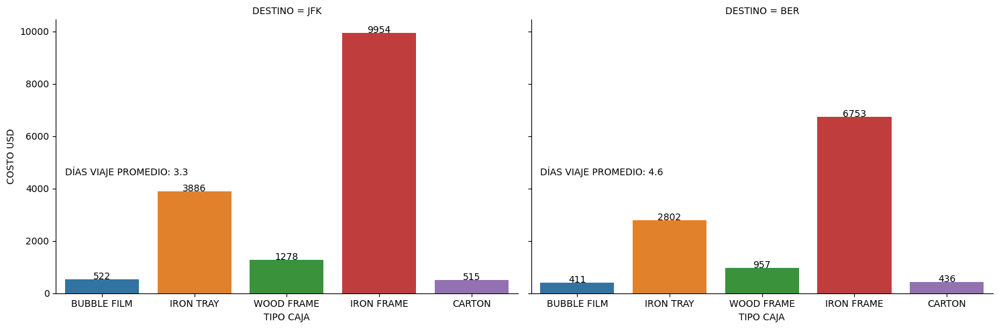

In [ ]:
g = sns.catplot(data=DSNX_8,kind='bar',y='COSTO USD',x='TIPO CAJA',col='DESTINO',height=5,aspect=1.5)
for i,ax in enumerate(g.axes.flat):
  if i==1:
    ax.annotate('DÍAS VIAJE PROMEDIO: ' + str(DIAS_VIAJE['BER']), xy=(-0.4, 4500), xytext=(-0.4, 4500)) #Acá usamos el dato del diccionario creado anteriormente
  else:
    ax.annotate('DÍAS VIAJE PROMEDIO: ' + str(DIAS_VIAJE['JFK']), xy=(-0.4, 4500), xytext=(-0.4, 4500)) #Acá usamos el dato del diccionario creado anteriormente
  for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2., p.get_height(), f'{p.get_height():.0f}', ha='center')

In [ ]:
DSNX_8 = DSNX[['TIPO CAJA','PESO CAJA','VOLUMEN CAJA']] #Traigo datos para comparar con el gráfico
DSNX_8 = DSNX_8[(DSNX.index == 1716) | (DSNX.index == 3890) | (DSNX.index == 3891) | (DSNX.index == 4174) | (DSNX.index == 21632)]
DSNX_8 = DSNX_8.reset_index(drop=True)
DSNX_8

,TIPO CAJA,PESO CAJA,VOLUMEN CAJA
0,BUBBLE FILM,10.00,0.012160
1,IRON TRAY,384.00,1.291500
2,WOOD FRAME,134.92,0.355488
3,IRON FRAME,273.60,5.733000
4,CARTON,12.00,0.045600


Sorprende ver que tenemos más demora en enviar a Berlín que a Nueva York (y en general sale más barato).

En cuanto a los costos, el orden de cual es el más caro se mantiene para ambos destinos. A su vez, este orden se corresponde con el volumen, no con el peso (lo cual sorprende también, ya que en general los couriers cobran por peso, no por volumen).

##7.3 - Extracción masiva de datos

###7.3.1 - Selección y preparación de columnas relevantes

In [ ]:
DSNX_9 = DSNX[['TIPO CAJA','PESO CAJA','LARGO CAJA','ANCHO CAJA','ALTURA CAJA']] #Estas son las columnas del DS que me interesan para realizar la consulta
DSNX_9

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA
0,IRON FRAME,153.92,1700,100,130
1,IRON FRAME,153.92,1700,100,130
2,IRON FRAME,153.92,1700,100,130
3,IRON FRAME,153.92,1700,100,130
4,IRON FRAME,153.92,1700,100,130
...,...,...,...,...,...
23599,CARTON,6.81,550,460,360
23600,CARTON,6.81,550,460,360
23601,CARTON,6.81,550,460,360
23602,CARTON,6.81,550,460,360


In [ ]:
DSNX_9 = DSNX_9.drop_duplicates() #Borro cajas duplicadas
DSNX_9 = DSNX_9.reset_index(drop=True) #Reinicio índice
DSNX_9

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA
0,IRON FRAME,153.92,1700,100,130
1,IRON FRAME,1176.00,1700,650,1250
2,IRON FRAME,636.00,2250,1400,900
3,IRON FRAME,1248.00,2250,5200,1610
4,IRON FRAME,513.00,2250,1900,600
...,...,...,...,...,...
1325,CARTON,4.50,560,300,195
1326,CARTON,18.78,800,500,530
1327,CARTON,24.65,280,200,150
1328,CARTON,14.81,300,200,140


In [ ]:
DSNX_9['LARGO CAJA'] = DSNX_9['LARGO CAJA'].div(10) #Paso a cm las 3 columnas
DSNX_9['ANCHO CAJA'] = DSNX_9['ANCHO CAJA'].div(10)
DSNX_9['ALTURA CAJA'] = DSNX_9['ALTURA CAJA'].div(10)

In [ ]:
DSNX_9['VOLUMEN CAJA'] = DSNX_9['LARGO CAJA'].div(100) * DSNX_9['ANCHO CAJA'].div(100) * DSNX_9['ALTURA CAJA'].div(100) #Calculamos el volumen en m3
DSNX_9

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA
0,IRON FRAME,153.92,170.0,10.0,13.0,0.022100
1,IRON FRAME,1176.00,170.0,65.0,125.0,1.381250
2,IRON FRAME,636.00,225.0,140.0,90.0,2.835000
3,IRON FRAME,1248.00,225.0,520.0,161.0,18.837000
4,IRON FRAME,513.00,225.0,190.0,60.0,2.565000
...,...,...,...,...,...,...
1325,CARTON,4.50,56.0,30.0,19.5,0.032760
1326,CARTON,18.78,80.0,50.0,53.0,0.212000
1327,CARTON,24.65,28.0,20.0,15.0,0.008400
1328,CARTON,14.81,30.0,20.0,14.0,0.008400


###7.3.2 - Análisis univariado (general)

In [ ]:
stats.describe(DSNX_9['PESO CAJA']) #Saco estadísticos

DescribeResult(nobs=1330, minmax=(0.32, 1248.0), mean=30.763827067669173, variance=10930.106959985122, skewness=7.776967998501532, kurtosis=72.60094198923666)

<Axes: xlabel='PESO CAJA', ylabel='Density'>

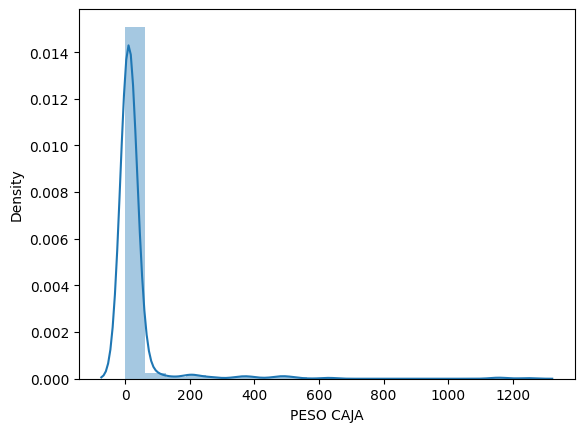

In [ ]:
sns.distplot(DSNX_9['PESO CAJA'],bins=20) #Acá lo compruebo

In [ ]:
stats.describe(DSNX_9['VOLUMEN CAJA']) #Saco estadísticos

DescribeResult(nobs=1330, minmax=(0.007000000000000001, 20.092800000000004), mean=0.2634731045112782, variance=1.2144706920188995, skewness=10.111092842260375, kurtosis=147.0742193829058)

<Axes: xlabel='VOLUMEN CAJA', ylabel='Density'>

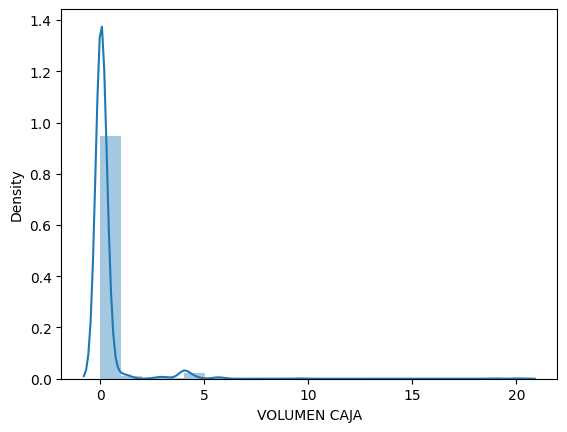

In [ ]:
sns.distplot(DSNX_9['VOLUMEN CAJA'],bins=20) #Acá lo compruebo

Tanto para el peso como para el volumen, sucede que tenemos gran concentración de datos en determinada parte del gráfico, y luego hay excepciones con valores bastante más grandes. Los valores de skewness lo comprueban, sabemos que para que una distribución sea simétrica debe estar en +-0.5, y tenemos valores fuera de ese rango.

En cuanto a la kurtosis, tenemos valores mayores a 3, lo que demuestra que ambas campanas son bastante altas y finas, con poca varianza (si no tuviéramos esos valores que provocan la asimetría).

###7.3.3 - Análisis univariado (por tipo de caja)

Ahora hilemos un poco más profundo, revisemos nuevamente las variables pero diferenciando por tipo de caja.

In [ ]:
DSNX_9.groupby('TIPO CAJA')['PESO CAJA','LARGO CAJA','ANCHO CAJA','ALTURA CAJA','VOLUMEN CAJA'].mean() #Veamos el promedio para tener una idea de cada tipo de caja

,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA
TIPO CAJA,,,,,
BUBBLE FILM,7.281373,133.431373,46.803922,20.921569,0.123364
CARTON,12.989860,54.460082,35.069959,26.168724,0.072310
IRON FRAME,410.629412,228.921569,172.431373,108.254902,4.589286
IRON TRAY,333.160000,197.222222,112.666667,74.333333,1.678375
WOOD FRAME,205.330000,161.750000,118.000000,76.500000,1.777872


Como se puede apreciar, las cajas CARTON y las BUBBLE FILM son las menos pesadas. En cuanto a dimensiones, las BUBBLE FILM son largas y finas en comparación con las CARTON. Ambas dos también son las menos voluminosas.

En cuanto al resto, a este nivel de análisis no hay grandes hallazgos en cuanto a dimensiones, sí sabemos que las IRON FRAME son las más pesadas superando las IRON TRAY por 100kg, y éstas últimas superan por lo mismo a las WOOD FRAME. Con respecto al volumen, las IRON TRAY y WOOD FRAME son similares, superadas por las IRON FRAME.

Grafiquemos para ver un poco mejor estos datos.

<Axes: xlabel='PESO CAJA', ylabel='TIPO CAJA'>

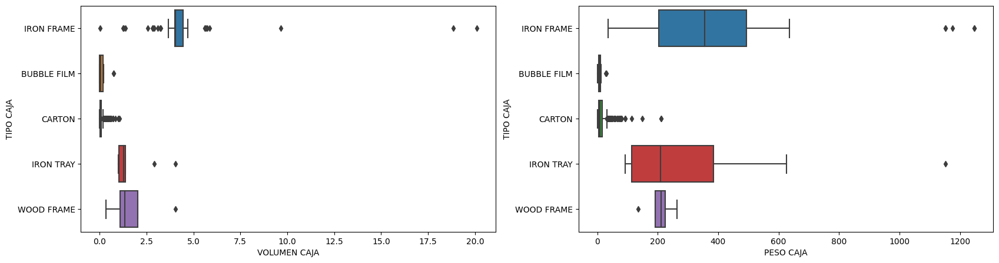

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(20, 5))
sns.boxplot(data=DSNX_9, x='VOLUMEN CAJA', y='TIPO CAJA', ax=axs[0])
sns.boxplot(data=DSNX_9, x='PESO CAJA', y='TIPO CAJA', ax=axs[1])

Este gráfico nos da una idea más visual del volumen y peso de cada tipo de caja.

Como ya habíamos observado, las de tipo CARTON y BUBBLE FILM conllevan poco volumen y peso.

Las WOOD FRAME son bastante consistentes en ambas medidas, similares a las IRON TRAY en volumen (incluso superándolas en algunas observaciones).

Las IRON TRAY son consistentes en volumen, pero tienen un rango más abarcativo de pesos, llegando a competir con las IRON FRAME e incluso pudiendo ser más livianas que las WOOD FRAME.

Finalmente, las IRON FRAME son bastante abarcativas en ambas medidas, aunque en volumen suelen superar a todas las demás. En cuanto a peso, algunas observaciones pueden ir desde ser similar a las WOOD FRAME hasta superar ampliamente las IRON TRAY.

Habiendo analizado peso y volumen, profundicemos un poco más en las dimensiones.

In [ ]:
DSNX_9G = DSNX_9.drop(['PESO CAJA','VOLUMEN CAJA'], axis=1) #Elimino ambas columnas ya que no las necesitaré para esta parte
DSNX_9G = pd.melt(DSNX_9G, 'TIPO CAJA', var_name='MEDIDA') #Realizo un melt para modificar el DF a como me sirve
DSNX_9G = DSNX_9G.rename(columns={'value': 'Medida en cm'}) #Renombro la columna nueva
DSNX_9G

,TIPO CAJA,MEDIDA,Medida en cm
0,IRON FRAME,LARGO CAJA,170.0
1,IRON FRAME,LARGO CAJA,170.0
2,IRON FRAME,LARGO CAJA,225.0
3,IRON FRAME,LARGO CAJA,225.0
4,IRON FRAME,LARGO CAJA,225.0
...,...,...,...
3985,CARTON,ALTURA CAJA,19.5
3986,CARTON,ALTURA CAJA,53.0
3987,CARTON,ALTURA CAJA,15.0
3988,CARTON,ALTURA CAJA,14.0


<Axes: xlabel='Medida en cm', ylabel='TIPO CAJA'>

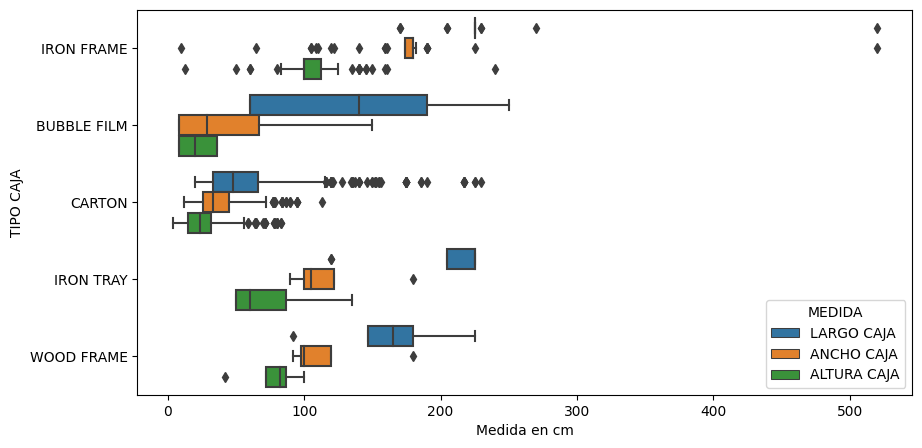

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
sns.boxplot(data=DSNX_9G, x='Medida en cm', y='TIPO CAJA', hue='MEDIDA', dodge=True, ax=ax)

Es interesante observar que, para toda caja, se cumple la relación LARGO > ANCHO > ALTURA. Por otra parte, también podemos identificar tres grupos:

1) Las cajas de tipo CARTON son bastante similares a un cubo, no hay grandes diferencias entre sus dimensiones.

2) Las cajas de tipo WOOD FRAME-IRON TRAY-IRON FRAME son similares en altura y ancho, teniendo siempre un largo moderadamente mayor al resto de las dimensiones.

3) Las cajas de tipo BUBBLE FILM tienen un largo ámpliamente mayor a las otras dimensiones, son como un "caño".

Finalmente, intentemos resumir todo lo visto en un solo gráfico.

In [ ]:
DSNX_9G = pd.melt(DSNX_9, 'TIPO CAJA', var_name='MEDIDA') #Realizo un melt para modificar el DF a como me sirve
DSNX_9G

,TIPO CAJA,MEDIDA,value
0,IRON FRAME,PESO CAJA,153.920000
1,IRON FRAME,PESO CAJA,1176.000000
2,IRON FRAME,PESO CAJA,636.000000
3,IRON FRAME,PESO CAJA,1248.000000
4,IRON FRAME,PESO CAJA,513.000000
...,...,...,...
6645,CARTON,VOLUMEN CAJA,0.032760
6646,CARTON,VOLUMEN CAJA,0.212000
6647,CARTON,VOLUMEN CAJA,0.008400
6648,CARTON,VOLUMEN CAJA,0.008400


<Axes: xlabel='value', ylabel='MEDIDA'>

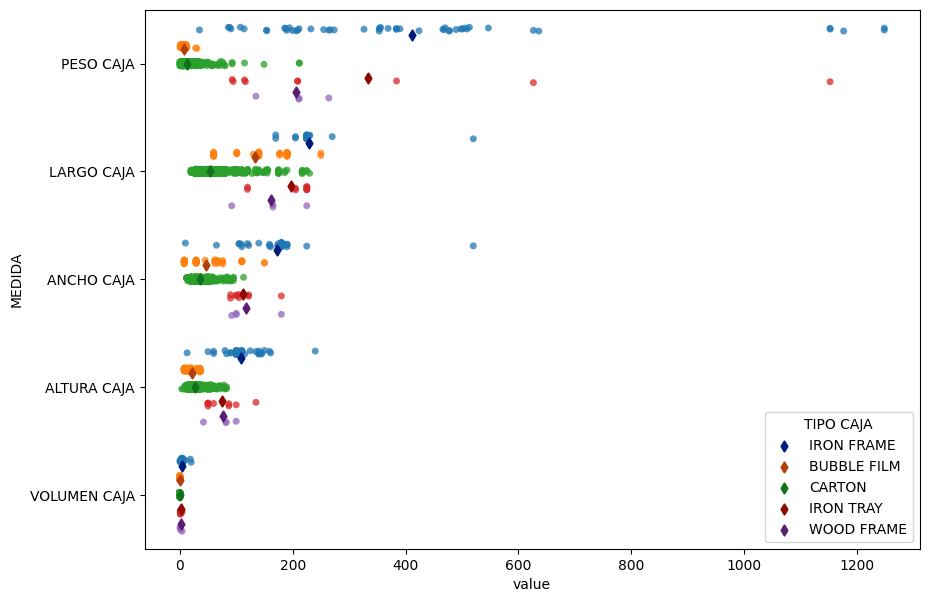

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 7))
sns.stripplot(data=DSNX_9G, x='value', y='MEDIDA', hue='TIPO CAJA', dodge=True, alpha=.75, zorder=1, legend=False, ax=ax)
sns.pointplot(data=DSNX_9G, x='value', y='MEDIDA', hue='TIPO CAJA', join=False, dodge=.8 - .8 / 3, palette="dark", markers="d", scale=.75, errorbar=None, ax=ax)

En este gráfico podemos observar la disperción para cada medida, diferenciando por tipo de caja. A su vez, se marca en oscuro el promedio.

En volumen no hay prácticamente disperción, y en el peso si que la hay. En el resto de las medidas, la disperción es moderada.

###7.3.4 - Consulta masiva a API + Data wrangling

Ahora que tenemos bien analizadas las variables de interés, es momento de utilizar masivamente la API para entender más sobre los costos de transporte. Haremos una consulta a la API por cada fila del DF (aprox. 1200 consultas).

In [ ]:
ACTUALIZAR_API = False #Hacer la consulta para todas las cajas del DF lleva más de una hora, con este parámetro defino si quiero hacerlo o no

In [ ]:
if ACTUALIZAR_API == True: #En el caso de que quiera realizar la consulta, se ejecuta
  destination = 'JFK' #Defino el destino, utilizaremos Nueva York como ejemplo
  for i in DSNX_9.index: #Voy iterando por cada caja
    weight = DSNX_9.loc[i,'PESO CAJA'] #Peso caja en kg
    width = DSNX_9.loc[i,'ANCHO CAJA'] #Ancho caja en cm
    length = DSNX_9.loc[i,'LARGO CAJA'] #Largo caja en cm
    height = DSNX_9.loc[i,'ALTURA CAJA'] #Altura caja en cm
    url = 'https://ship.freightos.com/api/shippingCalculator?loadtype=' + loadtype + '&weight=' + str(weight) + '&width=' + str(width) + '&length=' + str(length) + '&height=' + str(height) + '&origin=' + origin + '&quantity=' + str(quantity) + '&destination=' + destination
    ok_url = 0 #Aseguro que el programa entre al while
    while ok_url!=200: #Esto va a iterar hasta que la request devuelva 200
      response = requests.get(url)
      ok_url = response.status_code
    data = response.json() #Obtengo los datos del json y en los 2 rengones siguientes extraigo el costo y tiempo de viaje promedio
    try: #Hago un try/except porque a veces puede pasar que la API no tiene datos para los inputs que le doy
      DSNX_9.loc[i,'COSTO USD'] = (data['response']['estimatedFreightRates']['mode']['price']['min']['moneyAmount']['amount'] + data['response']['estimatedFreightRates']['mode']['price']['max']['moneyAmount']['amount']) / 2
      DSNX_9.loc[i,'DIAS VIAJE'] = (data['response']['estimatedFreightRates']['mode']['transitTimes']['min'] + data['response']['estimatedFreightRates']['mode']['transitTimes']['max']) / 2
      print(i, 'ok', url) #Voy printeando el i para saber por donde va, un ok/fail para ver si va fallando mucho o no, y el url para saber qué devuelve la API
    except:
      DSNX_9.loc[i,'COSTO USD'] = np.nan #En el caso de que la API falle, me devuelve NaN
      DSNX_9.loc[i,'DIAS VIAJE'] = np.nan
      print(i, 'fail', url)
  DSNX_9.to_excel('DatosAPI.xlsx', index=False) #Al terminar, guardo los datos en un Excel
else:
  DSNX_9 = pd.read_excel('DatosAPI.xlsx') #Si no quiero realizar la consulta, tomo los datos del último Excel que había generado
DSNX_9

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA,COSTO USD,DIAS VIAJE
0,IRON FRAME,153.92,170,10.0,13.0,0.022100,819.97,4.0
1,IRON FRAME,1176.00,170,65.0,125.0,1.381250,5856.48,4.0
2,IRON FRAME,636.00,225,140.0,90.0,2.835000,3273.12,10.5
3,IRON FRAME,1248.00,225,520.0,161.0,18.837000,NaN,NaN
4,IRON FRAME,513.00,225,190.0,60.0,2.565000,2656.71,10.5
...,...,...,...,...,...,...,...,...
1193,CARTON,23.43,36,30.0,18.0,0.019440,357.84,4.0
1194,CARTON,17.72,40,30.0,20.0,0.024000,353.50,4.0
1195,CARTON,15.02,28,20.0,15.0,0.008400,353.50,4.0
1196,CARTON,18.52,28,20.0,15.0,0.008400,353.50,4.0


In [ ]:
DSNX_9.info() #Tenemos un par de nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1198 entries, 0 to 1197
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TIPO CAJA     1198 non-null   object 
 1   PESO CAJA     1198 non-null   float64
 2   LARGO CAJA    1198 non-null   int64  
 3   ANCHO CAJA    1198 non-null   float64
 4   ALTURA CAJA   1198 non-null   float64
 5   VOLUMEN CAJA  1198 non-null   float64
 6   COSTO USD     1196 non-null   float64
 7   DIAS VIAJE    1196 non-null   float64
dtypes: float64(6), int64(1), object(1)
memory usage: 75.0+ KB


In [ ]:
DSNX_9[DSNX_9['COSTO USD'].isnull()] #Los nulos son éstos, tengo la idea de que el problema estuvo en que el peso es demasiado

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA,COSTO USD,DIAS VIAJE
3,IRON FRAME,1248.0,225,520.0,161.0,18.8370,NaN,NaN
654,IRON FRAME,1248.0,520,161.0,240.0,20.0928,NaN,NaN


In [ ]:
DSNX_9.sort_values('PESO CAJA',ascending=False) #Reordeno los valores por peso, efectivamente vemos que son las cajas más pesadas, se ve que la API no puede calcular con esos parámetros

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA,COSTO USD,DIAS VIAJE
654,IRON FRAME,1248.00,520,161.0,240.0,20.092800,NaN,NaN
3,IRON FRAME,1248.00,225,520.0,161.0,18.837000,NaN,NaN
1,IRON FRAME,1176.00,170,65.0,125.0,1.381250,5856.480,4.0
963,IRON FRAME,1152.00,225,180.0,100.0,4.050000,5928.615,4.0
576,IRON TRAY,1152.00,205,105.0,135.0,2.905875,5839.425,4.0
...,...,...,...,...,...,...,...,...
1029,CARTON,0.54,35,25.0,20.0,0.017500,315.100,4.0
306,CARTON,0.54,30,20.0,17.0,0.010200,307.575,4.0
497,BUBBLE FILM,0.53,60,29.0,36.0,0.062640,345.350,4.0
307,CARTON,0.51,28,20.0,15.0,0.008400,307.575,4.0


In [ ]:
DSNX_9 = DSNX_9.dropna(subset='COSTO USD') #Elimino esos nulos, ya que no serán de utilidad para realizar análisis si no tenemos el valor de costo. Además, pertenecen a casos excepcionales de cajas muy pesadas
DSNX_9 = DSNX_9.reset_index(drop=True) #Reinicio índice
DSNX_9

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA,COSTO USD,DIAS VIAJE
0,IRON FRAME,153.92,170,10.0,13.0,0.022100,819.97,4.0
1,IRON FRAME,1176.00,170,65.0,125.0,1.381250,5856.48,4.0
2,IRON FRAME,636.00,225,140.0,90.0,2.835000,3273.12,10.5
3,IRON FRAME,513.00,225,190.0,60.0,2.565000,2656.71,10.5
4,IRON FRAME,90.61,225,190.0,110.0,4.702500,4122.42,4.0
...,...,...,...,...,...,...,...,...
1191,CARTON,23.43,36,30.0,18.0,0.019440,357.84,4.0
1192,CARTON,17.72,40,30.0,20.0,0.024000,353.50,4.0
1193,CARTON,15.02,28,20.0,15.0,0.008400,353.50,4.0
1194,CARTON,18.52,28,20.0,15.0,0.008400,353.50,4.0


In [ ]:
DSNX_9.info() #Ahora si, no hay nulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1196 entries, 0 to 1195
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   TIPO CAJA     1196 non-null   object 
 1   PESO CAJA     1196 non-null   float64
 2   LARGO CAJA    1196 non-null   int64  
 3   ANCHO CAJA    1196 non-null   float64
 4   ALTURA CAJA   1196 non-null   float64
 5   VOLUMEN CAJA  1196 non-null   float64
 6   COSTO USD     1196 non-null   float64
 7   DIAS VIAJE    1196 non-null   float64
dtypes: float64(6), int64(1), object(1)
memory usage: 74.9+ KB


###7.3.5 - Análisis bivariado/multivariado

Ahora que tenemos el DF listo para analizar, realicemos algunos gráficos.

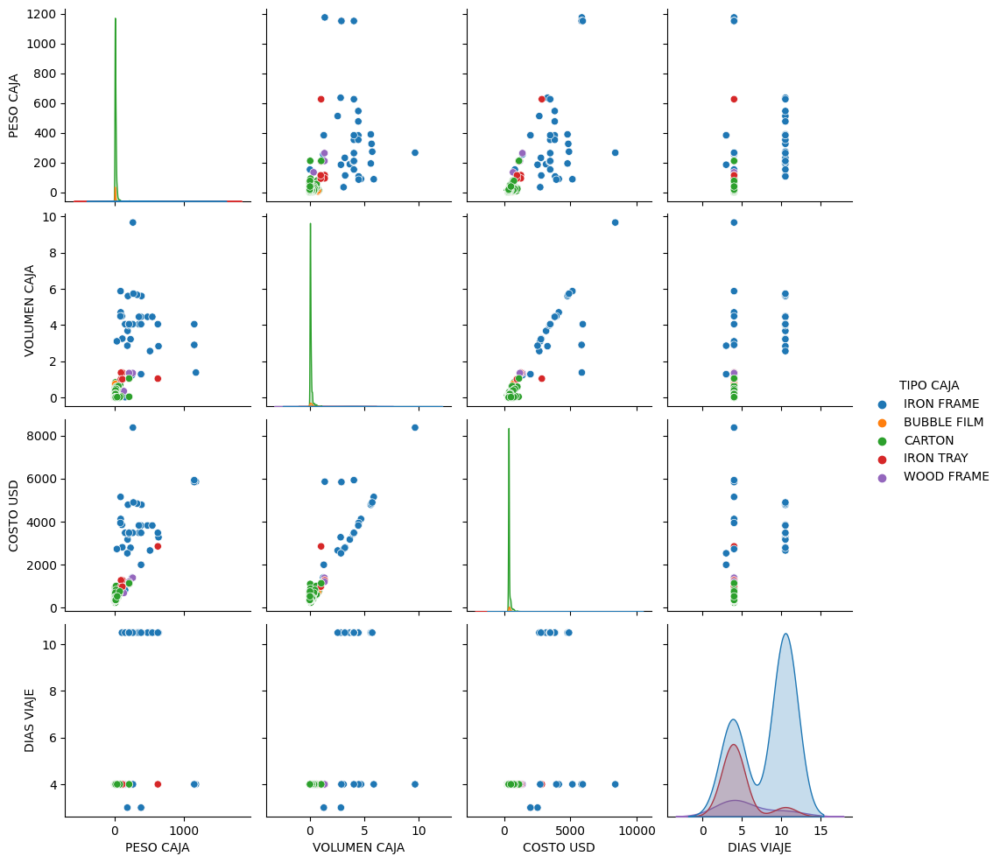

In [ ]:
DSNX_9G = DSNX_9.drop(['LARGO CAJA','ANCHO CAJA','ALTURA CAJA'], axis=1) #Saco algunas columnas que no me interesan
sns.pairplot(DSNX_9G, hue='TIPO CAJA') #Grafico

Mirando este primer conjunto de gráficos sacamos dos ideas importantes:

1. El volumen y el costo del viaje casi tienen una relación lineal.
2. El volumen y el peso permiten ver los tipos de caja agrupados en conjuntos bastante bien diferenciados, esto confirma que ambas variables son muy buenas para predecir el tipo de caja, como vimos en secciones anteriores.

Estudiemos en profundidad el punto 1.

In [ ]:
DSNX_9G = pd.melt(DSNX_9, ['TIPO CAJA','PESO CAJA','LARGO CAJA','ANCHO CAJA','ALTURA CAJA','VOLUMEN CAJA'], var_name='DATO API') #Realizo un melt para modificar el DF a como me sirve
DSNX_9G

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA,DATO API,value
0,IRON FRAME,153.92,170,10.0,13.0,0.022100,COSTO USD,819.97
1,IRON FRAME,1176.00,170,65.0,125.0,1.381250,COSTO USD,5856.48
2,IRON FRAME,636.00,225,140.0,90.0,2.835000,COSTO USD,3273.12
3,IRON FRAME,513.00,225,190.0,60.0,2.565000,COSTO USD,2656.71
4,IRON FRAME,90.61,225,190.0,110.0,4.702500,COSTO USD,4122.42
...,...,...,...,...,...,...,...,...
2387,CARTON,23.43,36,30.0,18.0,0.019440,DIAS VIAJE,4.00
2388,CARTON,17.72,40,30.0,20.0,0.024000,DIAS VIAJE,4.00
2389,CARTON,15.02,28,20.0,15.0,0.008400,DIAS VIAJE,4.00
2390,CARTON,18.52,28,20.0,15.0,0.008400,DIAS VIAJE,4.00


(0.0, 12.0)

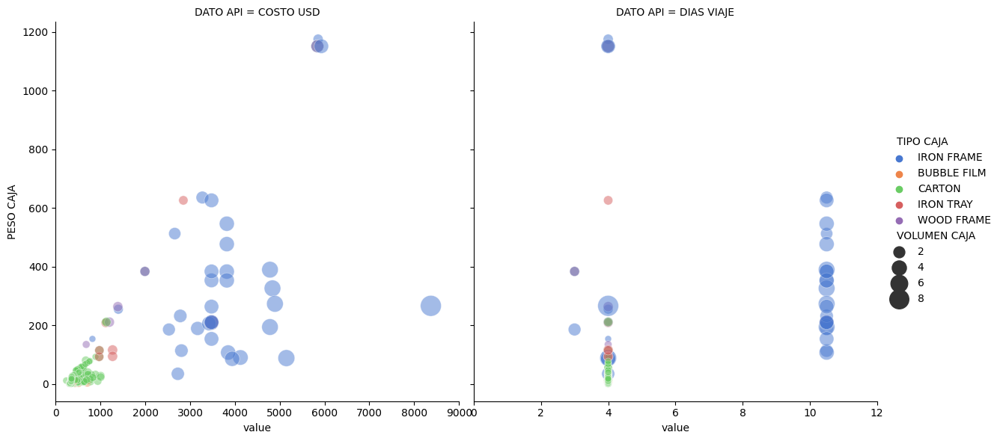

In [ ]:
g = sns.relplot(x='value', y='PESO CAJA', hue='TIPO CAJA', size='VOLUMEN CAJA', col='DATO API', sizes=(40, 400), alpha=.5, palette="muted", height=6, data=DSNX_9G, facet_kws=dict(sharex=False))
g.axes[0,0].set_xlim(0,9000)
g.axes[0,1].set_xlim(0,12)

Estos gráficos nos dan una idea de cómo se comportan los costos y los días de viaje, en función del volumen y el peso de cada caja. A su vez, podemos identificar el tipo de caja por colores.

En cuanto al costo, claramente aumenta a más peso o volumen. Aunque, cómo habíamos previsto en las primeras consultas de la API y en el gráfico anterior, el volumen es mucho más contundente a la hora de definir el costo.

Para los días de viaje, a priori no parece que el peso tenga un gran impacto. El volumen sí marca alguna tendencia, pero también tenemos excepciones.

Veamos un gráfico más como resumen de todo esto.

<Axes: >

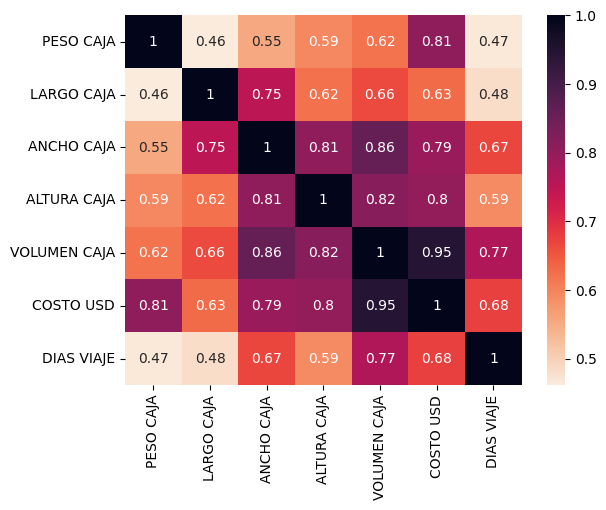

In [ ]:
sns.heatmap(DSNX_9.corr(), cmap='rocket_r', annot=True) #Acá veo el mapa de calor

Mirando la matriz de correlación, verificamos lo explicado anteriormente. El volumen tiene más importancia que el peso a la hora de definir los costos y días de viaje.

Intentemos ver estas relaciones desde otras perspectivas, dejando de lado el tipo de caja.

In [ ]:
pca_obj = PCA() #Aplico PCA para unificar peso, largo, ancho y altura en una sola variable
DSNX_9G = pd.DataFrame(pca_obj.fit_transform(DSNX_9.iloc[:,1:5]))
DSNX_9G

,0,1,2,3
0,142.186505,-25.983037,87.909037,7.526747
1,1107.049792,331.765683,82.524508,42.771961
2,638.940735,56.457252,21.923778,-10.909791
3,531.944289,-3.664786,-9.687615,-60.576892
4,151.571949,-174.990443,-74.243558,-8.516884
...,...,...,...,...
1191,-14.442038,28.155410,-0.389724,-4.659177
1192,-18.150553,22.271682,-0.182679,-2.612255
1193,-27.102520,35.583576,4.094094,-1.802952
1194,-23.891463,36.936273,4.412315,-1.892710


In [ ]:
pca_obj.explained_variance_ratio_ #Veo que con la primer columna tengo el 79% de la info.

array([0.7927738 , 0.16928428, 0.0296173 , 0.00832462])

In [ ]:
DSNX_9 = pd.concat([DSNX_9, DSNX_9G[0]], axis=1) #Agregemos al DF la columna conseguida con PCA
DSNX_9 = DSNX_9.rename(columns={0: 'PCA'}) #Cambio de nombre a la columna
DSNX_9

,TIPO CAJA,PESO CAJA,LARGO CAJA,ANCHO CAJA,ALTURA CAJA,VOLUMEN CAJA,COSTO USD,DIAS VIAJE,PCA
0,IRON FRAME,153.92,170,10.0,13.0,0.022100,819.97,4.0,142.186505
1,IRON FRAME,1176.00,170,65.0,125.0,1.381250,5856.48,4.0,1107.049792
2,IRON FRAME,636.00,225,140.0,90.0,2.835000,3273.12,10.5,638.940735
3,IRON FRAME,513.00,225,190.0,60.0,2.565000,2656.71,10.5,531.944289
4,IRON FRAME,90.61,225,190.0,110.0,4.702500,4122.42,4.0,151.571949
...,...,...,...,...,...,...,...,...,...
1191,CARTON,23.43,36,30.0,18.0,0.019440,357.84,4.0,-14.442038
1192,CARTON,17.72,40,30.0,20.0,0.024000,353.50,4.0,-18.150553
1193,CARTON,15.02,28,20.0,15.0,0.008400,353.50,4.0,-27.102520
1194,CARTON,18.52,28,20.0,15.0,0.008400,353.50,4.0,-23.891463


<Axes: xlabel='ALTURA CAJA', ylabel='COSTO USD'>

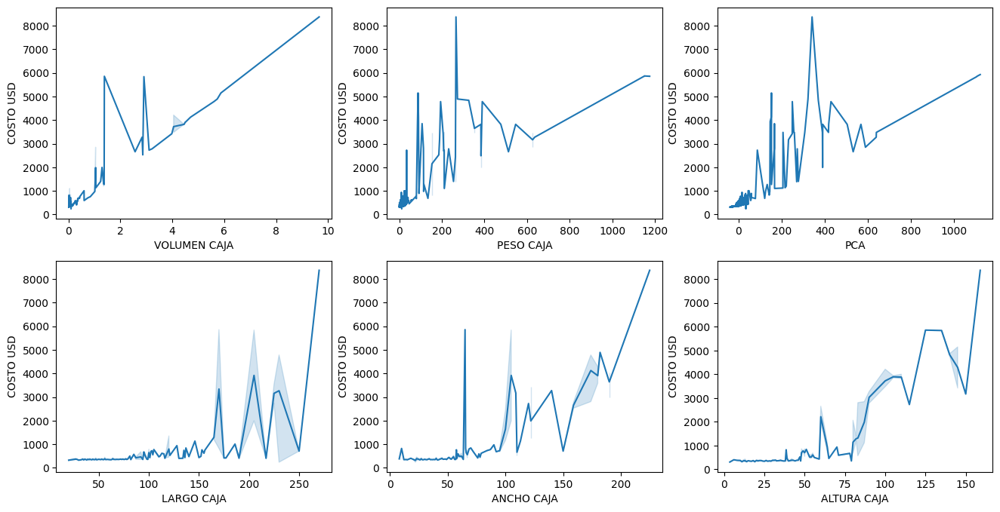

In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(16, 8))
sns.lineplot(data=DSNX_9, x='VOLUMEN CAJA', y='COSTO USD', ax=axs[0,0])
sns.lineplot(data=DSNX_9, x='PESO CAJA', y='COSTO USD', ax=axs[0,1])
sns.lineplot(data=DSNX_9, x='PCA', y='COSTO USD', ax=axs[0,2])
sns.lineplot(data=DSNX_9, x='LARGO CAJA', y='COSTO USD', ax=axs[1,0])
sns.lineplot(data=DSNX_9, x='ANCHO CAJA', y='COSTO USD', ax=axs[1,1])
sns.lineplot(data=DSNX_9, x='ALTURA CAJA', y='COSTO USD', ax=axs[1,2])

Los gráficos son bastante contundentes en que, a mayor sea la medida, mayor será el costo.

Por supuesto esta tendencia lineal tiene excepciones, ya que las varibales por separado no logran explicar del todo el problema (por ejemplo, puede que una caja tenga poco ancho pero el costo sea elevado ya que justo pesa mucho).

En este sentido uno esperaría que PCA fuera el gráfico más recto, aunque sorprendentemente el volumen por si solo, explica mejor los datos que cualquier otra medida (con excepciones, por supuesto).

Veamos los días de viaje.

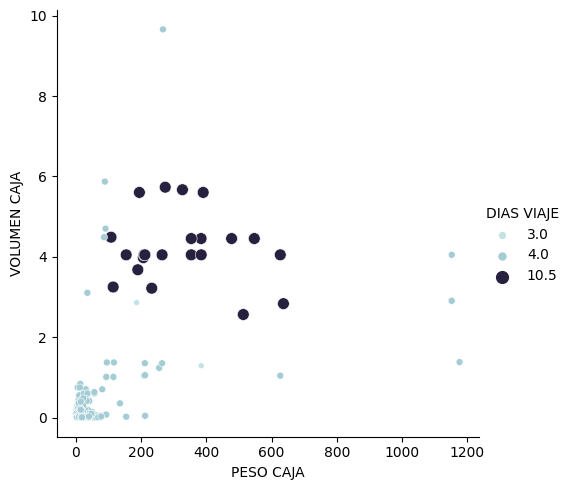

In [ ]:
sns.relplot(data=DSNX_9, x='PESO CAJA', y='VOLUMEN CAJA', hue='DIAS VIAJE', size='DIAS VIAJE', palette='ch:start=.2,rot=-.3')

En este caso vemos con claridad tres casos.

1) A poco volumen y peso, los días de viaje son 3-4.

2) A volumen y peso moderados, los días de viaje son 10.

3) A poco volumen y mucho peso (o viceversa), los días de viaje son 3-4.


##7.4 - Insights y conclusión

En esta sección del proyecto nos hemos encargado de analizar a fondo los costos involucrados en envíos internacionales de bultos. Este estudio nos permitió conocer de mejor manera qué variables se destacan a la hora del cálculo de los mismos, y así tener una mejor idea de qué atacar a la hora de querer reducirlos.

Como conclusiones podemos destacar:

1. Las distribuciones de volumen y peso (sin importar el tipo de caja) tienen una kurtosis muy alta.

2. El volumen y el peso permiten ver los tipos de caja agrupados en conjuntos bastante bien diferenciados, esto confirma que ambas variables son muy buenas para predecir el tipo de caja, como vimos en secciones anteriores.

3. La distancia de un destino a otro no es la variable definitiva a la hora de determinar los días de viaje que tendrá un bulto. Lo pudimos comprobar comparando lo que se demora en el trayecto China-Alemania vs China-EE.UU. De cierta forma tiene sentido, ya que probablemente el tráfico marítimo hacia EE.UU. sea mayor que el que va a Alemania (aumentando la frecuencia al enviarse más volumen).

4. El volumen del bulto aumenta más el costo de envío en comparación con lo que lo aumenta el peso. Es más, el volumen tiene casi una relación lineal con el costo.

5. En general el peso y volumen no afecta los días de viaje, solamente hay una influencia si el bulto es pesado y al mismo tiempo voluminoso, de lo contrario la cantidad de días se mantiene invariante.



#8 - Predicción de tipo de pallet (usando modelos sup. de ML)

Para finalizar el análisis de las preguntas iniciales, se intentará responder si es posible predecir en qué tipo de pallet irá una referencia, solamente conociendo información de ella, y no de las bases/cajas involucradas en el proceso.

Recordemos que se tienen bases inspeccionables y no inspeccionables (dependiendo de la cantidad de clases involucradas en la base). Las referencias que salen de las no inspeccionables, van en pallets directos, ya que todas pertenecen a la misma clase, por ende no hace falta separar. Por otro lado, las demás irán en pallets mixtos o dedicados, dependiendo del volumen total que conlleve cada referencia.

Por ejemplo, si todas las piezas de una referencia llegan a ocupar el volumen de medio pallet, ese pallet tendrá que ser compartido con otras referencias hasta completarse (esto es un pallet mixto). En cambio, si la cantidad de piezas de una referencia es suficiente como para completar un pallet, este será un pallet dedicado.

En resumen, para determinar el tipo de pallet se tienen en cuanta variables como:

1. Si la base es inspeccionable o no, lo cual depende de la cantidad de clases/base.
2. El volumen total que ocupan todas las piezas de una referencia, lo cual depende del volumen de cada caja y de la cantidad de piezas dentro de la caja.

Todas estas variables involucran bases y cajas, queremos saber si, teniendo información solamente de la referencia, podemos determinar de antemano en que tipo de pallet irá.




##8.1 - Feature engineering

Será necesario determinar características de las referencias que sean independientes de las bases y cajas.

Para eso calcularemos el peso y volumen de cada una, así como también cuantas se usan por versión.

In [ ]:
DSNX['UNID TOTAL EN CAJA'] = DSNX.groupby(['VERSION','CAJA'])['UNID/CAJA'].transform('sum') #Dada una caja, sabemos cuantas unidades de una referencia vienen en ella. Calculemos cuantas unidades vienen dentro en total, teniendo en cuenta que algunas cajas contienen varias referencias
DSNX['% UNID EN CAJA'] = DSNX['UNID/CAJA'] / DSNX['UNID TOTAL EN CAJA'] #Dado el total de unidades en la caja, calculemos que porcentaje del total ocupa cada referencia
DSNX['PESO REF'] = (DSNX['PESO CAJA'] * DSNX['% UNID EN CAJA']) / DSNX['UNID/CAJA'] #Sabiendo el peso de la caja y el porcentaje de unidades, aproximemos el peso de cada referencia
DSNX['VOL REF'] = (DSNX['VOLUMEN CAJA'] * DSNX['% UNID EN CAJA']) / DSNX['UNID/CAJA'] #Sabiendo el volumen de la caja y el porcentaje de unidades, aproximemos el volumen de cada referencia
DSNX['PESO REF'] = DSNX.groupby(['REFERENCIA'])['PESO REF'].transform('mean') #Como es una aproximación, cada fila no va a dar igual, promediemos para unificar
DSNX['VOL REF'] = DSNX.groupby(['REFERENCIA'])['VOL REF'].transform('mean') #Como es una aproximación, cada fila no va a dar igual, promediemos para unificar
DSNX['REFS TOTAL'] = DSNX.groupby(['VERSION','REFERENCIA'])['UNID/CAJA'].transform('sum') #Calculemos cuantas unidades de cada referencia se usan por versión

In [ ]:
DSNX_11 = DSNX[['CLASE','VERSION','UNID/CAJA','PESO REF','VOL REF','REFS TOTAL','TIPO PALLET']] #Estas serán las columnas que utilizaremos para predecir
reemplazos = {'DIRECTO': 1, 'DEDICADO': 2, 'MIXTO': 3} #Reemplazo los strings por números para comenzar a trabajar
DSNX_11['TIPO PALLET'] = DSNX_11['TIPO PALLET'].replace(reemplazos)
DSNX_11

,CLASE,VERSION,UNID/CAJA,PESO REF,VOL REF,REFS TOTAL,TIPO PALLET
0,F1,M42,16,9.620000,0.051730,96,1
1,F1,M42,16,9.620000,0.051730,96,1
2,F1,M42,16,9.620000,0.051730,96,1
3,F1,M42,16,9.620000,0.051730,96,1
4,F1,M42,16,9.620000,0.051730,96,1
...,...,...,...,...,...,...,...
23599,A,A42,96,0.017047,0.000380,96,1
23600,A,A42,96,0.016922,0.000253,96,1
23601,A,A42,96,0.016922,0.000253,96,1
23602,A,A42,96,0.016922,0.000253,96,1


Finalmente se cuenta con información de la clase, versión, unidades/caja, peso, volumen y total de unidades de cada referencia, para predecir el tipo de pallet.

Toda esta información es íntegramente de las referencias, independientemente de las cajas o bases.

##8.2 - Entrenamiento, validación y testeo

A continuación separaremos los datos en trainval y test, para luego hacer CrossVal con el trainval.

In [ ]:
x_trainval, x_test, y_trainval, y_test = train_test_split(DSNX_11.iloc[:,:-1],DSNX_11.iloc[:,-1], test_size=0.30, random_state=42, stratify=DSNX_11.iloc[:,-1]) #Separamos en trainval y test
x_trainval.reset_index(drop=True, inplace=True) #Reinicio index
y_trainval.reset_index(drop=True, inplace=True)
x_test.reset_index(drop=True, inplace=True)
y_test.reset_index(drop=True, inplace=True)
print('Dimensiones matriz de trainval:',x_trainval.shape)
print('Dimensiones matriz de testeo:',x_test.shape)

Dimensiones matriz de trainval: (16522, 6)
Dimensiones matriz de testeo: (7082, 6)


In [ ]:
skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True) #Haremos CrossVal con 5 splits
splits = skf.get_n_splits(x_trainval, y_trainval)
splits

5

In [ ]:
col_cat = ['CLASE','VERSION'] #Mis columnas categóricas
col_num = ['UNID/CAJA','PESO REF','VOL REF','REFS TOTAL'] #Mis columnas numéricas

categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(sparse_output=False, drop='first'))]) #Parametrizo el OHE, dropeo las columnas que no aportan
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())]) #Parametrizo el SS

preprocessor = ColumnTransformer(transformers=[('num', numeric_transformer, col_num),('cat', categorical_transformer, col_cat)]) #Combina las transformaciones en un ColumnTransformer que aplicará las transformaciones correctas a las variables numéricas y categóricas

Probaremos con KNN, Regresión Logística, Support Vector Machine, Gradient Boosting Classifier y redes neuronales del tipo MLP.

In [ ]:
y_pred_list = [] #Genero lista para ir guardando los y_pred
aux = 0
for i in range(0,5): #Ahora que hicimos pipelines, podemos ir iterando entre varios modelos tuneando los hiperparámetros usando grillas, sin preocuparnos de filtraciones de datos

  if i==0: #Para cada valor de i, defino el modelo en un pipeline y sus hiperparámetros
    print('KNeighborsClassifier:')
    pipeline = Pipeline([('preprocessor', preprocessor),('clf', KNeighborsClassifier())])
    Params = {
    'clf__n_neighbors': np.arange(1, 500, 1),
    }

  elif i==1:
    print('LogisticRegression:')
    pipeline = Pipeline([('preprocessor', preprocessor),('clf', LogisticRegression(max_iter=100, penalty='l2', random_state=42))])
    Params = {
    'clf__C': [0.001, 0.01, 0.1, 1, 10],
    'clf__solver': ['lbfgs', 'liblinear', 'newton-cg', 'sag']
    }

  elif i==2:
    print('SVM:')
    pipeline = Pipeline([('preprocessor', preprocessor),('clf', SVC(max_iter=100, random_state=42))])
    Params = {
    'clf__C': [0.001, 0.01, 0.1, 1, 10],
    'clf__kernel': ['rbf', 'poly', 'sigmoid'],
    'clf__gamma': [0.001, 0.01, 0.1, 1, 10]
    }

  elif i==3:
    print('GradientBoostingClassifier:')
    pipeline = Pipeline([('preprocessor', preprocessor),('clf', GradientBoostingClassifier(n_estimators=100, random_state=42))])
    Params = {
    'clf__learning_rate': [0.001, 0.01, 0.1, 1, 10],
    'clf__max_depth': np.arange(4, 14, 2),
    'clf__min_samples_split': np.arange(10, 110, 20),
    'clf__min_samples_leaf': np.arange(5, 30, 5),
    }

  elif i==4:
    print('MLPClassifier:')
    pipeline = Pipeline([('preprocessor', preprocessor),('clf', MLPClassifier(hidden_layer_sizes=(50,100,50),max_iter=100, random_state=42))])
    Params = {
    'clf__activation': ['identity', 'logistic', 'tanh', 'relu'],
    'clf__solver': ['lbfgs', 'sgd', 'adam'],
    'clf__alpha': [0.00001, 0.0001, 0.001, 0.01, 0.1],
    'clf__learning_rate': ['constant', 'invscaling', 'adaptive']
    }

  modelo = BayesSearchCV(pipeline, Params, scoring="accuracy", n_jobs=-1, n_iter=10, cv=skf, random_state=42) #Grilla para tuneo
  modelo.fit(x_trainval, y_trainval) #Entreno
  y_pred = modelo.predict(x_test) #Testeo
  y_pred_list.append(y_pred) #Guardo y_pred para luego

  print('Mejores hiperparámetros encontrados:', modelo.best_params_)
  print(f'Accuracy promedio entre los CV usando esos hiperparámetros = {round(modelo.best_score_, 3)}')
  print(f'Accuracy final del modelo usando test = {round(accuracy_score(y_test, y_pred), 3)}\n')

  if modelo.best_score_>aux:
    y_score = modelo.predict_proba(x_test) #Guardo la info. del mejor modelo para la curva ROC
    aux = modelo.best_score_

KNeighborsClassifier:
Mejores hiperparámetros encontrados: OrderedDict([('clf__n_neighbors', 3)])
Accuracy promedio entre los CV usando esos hiperparámetros = 0.992
Accuracy final del modelo usando test = 0.993

LogisticRegression:
Mejores hiperparámetros encontrados: OrderedDict([('clf__C', 10.0), ('clf__solver', 'newton-cg')])
Accuracy promedio entre los CV usando esos hiperparámetros = 0.988
Accuracy final del modelo usando test = 0.986

SVM:
Mejores hiperparámetros encontrados: OrderedDict([('clf__C', 1.0), ('clf__gamma', 0.01), ('clf__kernel', 'rbf')])
Accuracy promedio entre los CV usando esos hiperparámetros = 0.897
Accuracy final del modelo usando test = 0.889

GradientBoostingClassifier:
Mejores hiperparámetros encontrados: OrderedDict([('clf__learning_rate', 1.0), ('clf__max_depth', 12), ('clf__min_samples_leaf', 10), ('clf__min_samples_split', 90)])
Accuracy promedio entre los CV usando esos hiperparámetros = 0.996
Accuracy final del modelo usando test = 0.997

MLPClassifier

Según el CrossVal realizado, el mejor modelo sería el GradientBoostingClassifier, con un accuracy promedio de 0.996.

Para corroborarlo, se realizó posteriormente el testeo, obteniendo un accuracy de 0.997 (por lo que confirmamos que el modelo predice de forma espectacular).

A continuación, graficaremos la curva ROC del modelo para cada tipo de pallet.

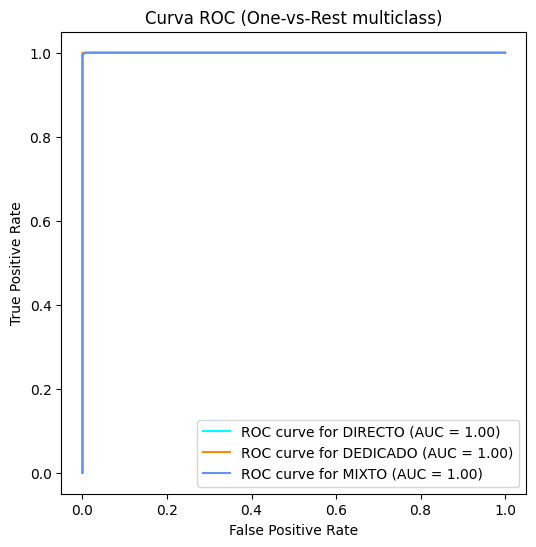

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
n_classes = len(np.unique(y_test))
target_names = ['DIRECTO', 'DEDICADO', 'MIXTO']

label_binarizer = LabelBinarizer().fit(y_trainval)
y_onehot_test = label_binarizer.transform(y_test)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
  RocCurveDisplay.from_predictions(y_onehot_test[:, class_id], y_score[:, class_id], name=f"ROC curve for {target_names[class_id]}", color=color, ax=ax)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title('Curva ROC (One-vs-Rest multiclass)')
plt.legend()
plt.show()

Lo que nos está diciendo es que el modelo tiene un porcentaje de verdaderos positivos muy alto, mientras que los falsos positivos son prácticamente despreciables. Lo cual reafirma la vigencia del modelo.

##8.3- Insights y conclusión

1. Es posible predecir en que tipo de pallet irá cada referencia, independientemente de la disposición de bases/cajas en el ingreso.
2. Se utilizaron 5 modelos, todos con excelentes resultados, aunque siendo GradientBoostingClassifier levemente superior.

Finalmente, podemos ver estas conclusiones reflejadas de forma animada en la matriz de confusión.

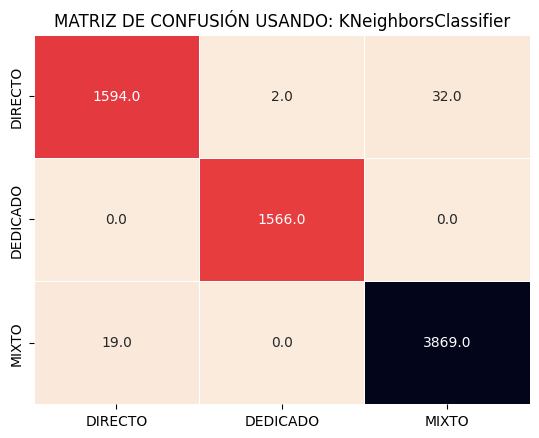

In [ ]:
fig, ax = plt.subplots()
titles = ['KNeighborsClassifier', 'LogisticRegression', 'SVM', 'GradientBoostingClassifier', 'MLPClassifier']

def update_conf_matrix(frame): #Crear una función para actualizar la matriz de confusión en cada frame
    ax.clear()  #Limpiar el eje en cada frame para actualizar la matriz de confusión
    y_pred = y_pred_list[frame % len(y_pred_list)]  #Cambiar y_pred entre los vectores en y_pred_list
    conf_matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(conf_matrix, annot=True, fmt=".1f", linewidth=.5, cmap="rocket_r", xticklabels=reemplazos.keys(), yticklabels=reemplazos.keys(), cbar=False)
    plt.title(f'MATRIZ DE CONFUSIÓN USANDO: {titles[frame % len(y_pred_list)]}') #Genero la matriz de confusión de manera gráfica

anim = animation.FuncAnimation(fig, update_conf_matrix, frames=len(y_pred_list), interval=5000)
HTML(anim.to_html5_video()) #Crear la animación